# Data Science - Delivery #2

In [1]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [2]:
# Read Data
df = pd.read_csv('../da```ta/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [3]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

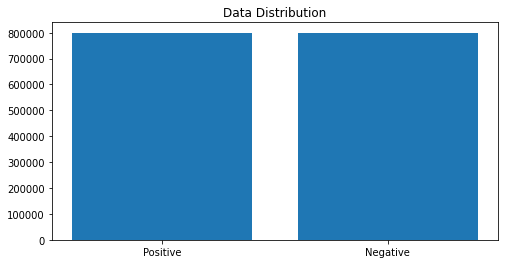

In [4]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [5]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gokse\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

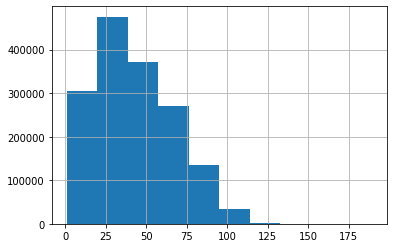

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [7]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [8]:
all_str = ""
for i in df.tweet:
    all_str += i

In [9]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('../data/letter_frequency_en_US.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081238,4687379.0
1,b,975326,0.016904,0.014893,859300.0
2,c,1705409,0.029557,0.027114,1564464.0
3,d,2289515,0.039680,0.043192,2492128.0
4,e,6471295,0.112156,0.120195,6935169.0
5,f,878849,0.015232,0.023039,1329304.0
6,g,2231747,0.038679,0.020257,1168838.0
7,h,2234047,0.038719,0.059215,3416628.0
8,i,3779579,0.065505,0.073054,4215160.0
9,j,143817,0.002493,0.001031,59502.0


<AxesSubplot:ylabel='letter'>

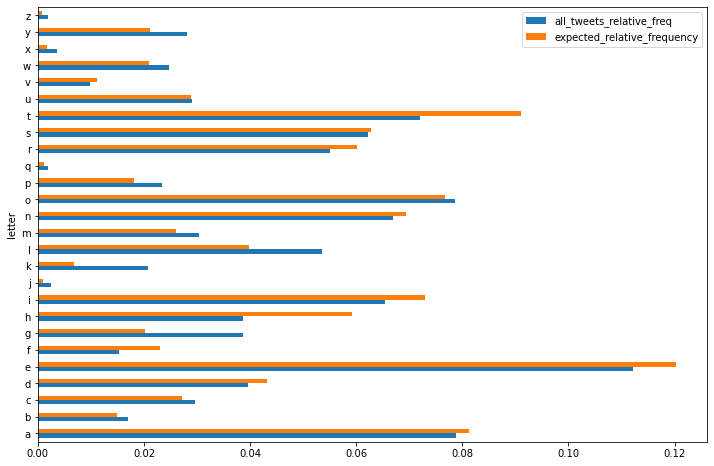

In [10]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [11]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.7%).

In [12]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.967421
expected,0.967421,1.000000


In [13]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [14]:
df1.number_of_characters.max()

189

In [15]:
df1.number_of_characters.min()

1

In [16]:
df1.number_of_characters.mean()

42.7974010379771

In [17]:
df1.number_of_characters.std()

24.158961650697616

## Number of Words

In [18]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [19]:
df1.number_of_words.max()

50

In [20]:
df1.number_of_words.min()

1

In [21]:
df1.number_of_words.mean()

7.244474128445898

In [22]:
df1.number_of_words.std()

4.030421805719796

### Positives + Negatives

<BarContainer object of 20 artists>

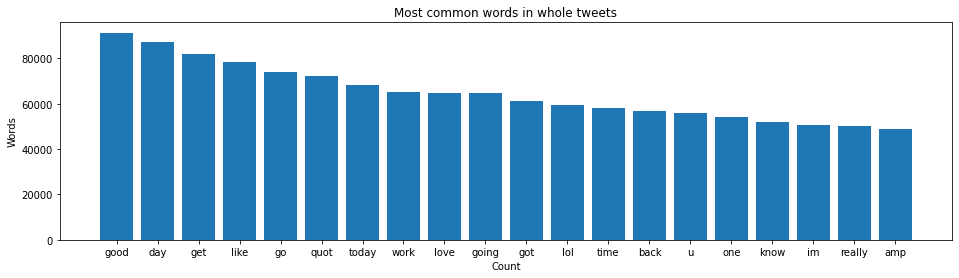

In [23]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

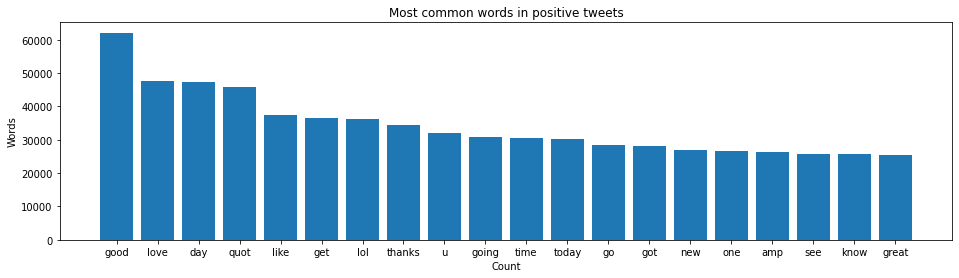

In [24]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

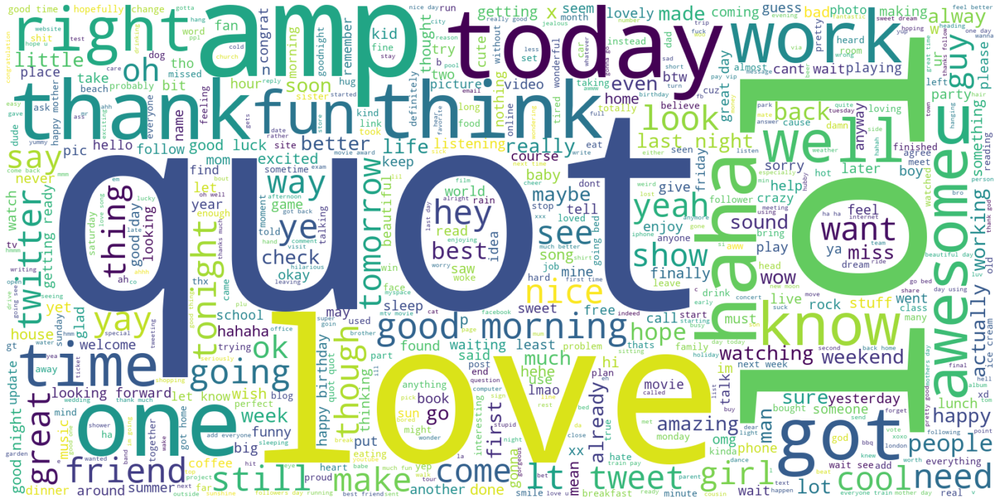

In [25]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

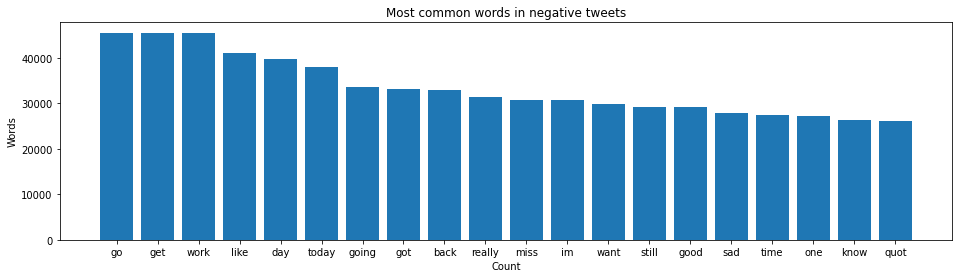

In [26]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

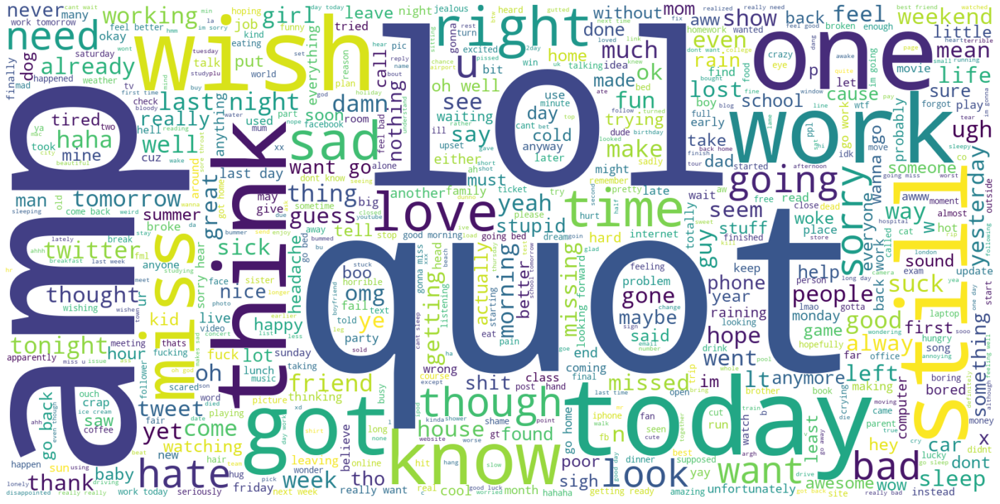

In [27]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [28]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [29]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [30]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Using TensorFlow backend.


Vocabulary Size : 290458


### GLOVE Embedding

In [31]:
MODELS_PATH = '../models'
EMBEDDING_DIMENSION = 300

In [32]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('../glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


## Feature Extraction

### Bag of Words

In [33]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(first_K_tweets)

# Dictionary
vectorizer.get_feature_names()

['00',
 '000',
 '000s',
 '002',
 '00am',
 '00pm',
 '01',
 '03',
 '04',
 '05',
 '050th',
 '06',
 '07',
 '08',
 '08pm',
 '09',
 '09am',
 '0f',
 '0g',
 '0ne',
 '10',
 '100',
 '1000',
 '1000th',
 '100k',
 '100th',
 '100x',
 '101',
 '102',
 '103',
 '1030',
 '104',
 '10512',
 '106',
 '1066',
 '108th',
 '10am',
 '10g',
 '10k',
 '10km',
 '10min',
 '10pin',
 '10pm',
 '10s',
 '10th',
 '11',
 '110',
 '1100',
 '111',
 '1111',
 '118',
 '119',
 '11am',
 '11pm',
 '11th',
 '12',
 '120',
 '1200',
 '121908inlove',
 '1230',
 '1230am',
 '123vc',
 '125',
 '1280',
 '12dp',
 '12h',
 '12hour',
 '12k',
 '12pm',
 '12s',
 '12th',
 '13',
 '130',
 '130am',
 '130km',
 '130pm',
 '131',
 '1337',
 '135',
 '139',
 '13hr',
 '13mins',
 '13th',
 '14',
 '140',
 '140chars',
 '140conf',
 '14277',
 '1440',
 '14745',
 '14th',
 '14yrs',
 '15',
 '150',
 '1500',
 '151',
 '15200',
 '15am',
 '15pm',
 '15th',
 '16',
 '160',
 '168',
 '16gb',
 '16gig',
 '16k',
 '16oz',
 '16th',
 '17',
 '1701',
 '172',
 '17th',
 '18',
 '180',
 '1800s',

In [34]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [35]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

left late go walk amp bucketing amp shelter tree canal bank
[0 0 0 ... 0 0 0]
watching mtv movie awards going school tomorrow paint justin
[0 0 0 ... 0 0 0]
surprising momma bear
[0 0 0 ... 0 0 0]
know guess seeing stayed past 5am got punished bullshit
[0 0 0 ... 0 0 0]
work ill sick pay tho
[0 0 0 ... 0 0 0]
hey suga loved hawaii pics btw
[0 0 0 ... 0 0 0]
guys pleaaaaaaaase make youtube video please please please
[0 0 0 ... 0 0 0]
bus early amp sad face
[0 0 0 ... 0 0 0]
watching santana concert tv bad pop still like
[0 0 0 ... 0 0 0]
currently taking break moving house movin dungeon room two yes two windows
[0 0 0 ... 0 0 0]
awesome torch pass tired though glad work tomorro
[0 0 0 ... 0 0 0]
goodmorning sisters dance recital part today 12 3 1 2 hours uh
[0 0 0 ... 0 0 0]
stop listening coeur de pirate wish understood lyrics little damn rusty french
[0 0 0 ... 0 0 0]
gave away baby chicken
[0 0 0 ... 0 0 0]
time bed sooo tired hate weekends cos work see bouncingsoulsnj tomorrow wait 

[0 0 0 ... 0 0 0]
still work
[0 0 0 ... 0 0 0]
hahahahaha loved even though mad wanted rain still love
[0 0 0 ... 0 0 0]
followfirday webmarketingmav harith seocopy halfdeck shonali epcotx seodojo dantanner love
[0 0 0 ... 0 0 0]
yes quite amazing jonasbrothers
[0 0 0 ... 0 0 0]
tried science idgi someone help tmrw
[0 0 0 ... 0 0 0]
alton towers tomorrow
[0 0 0 ... 0 0 0]
great animals lots food months come
[0 0 0 ... 0 0 0]
changed worried something
[0 0 0 ... 0 0 0]
cat got another bunny
[0 0 0 ... 0 0 0]
sooryy family hard loose someone love
[0 0 0 ... 0 0 0]
7son75 well meaning talk kidding idea
[0 0 0 ... 0 0 0]
feels sick get ready work
[0 0 0 ... 0 0 0]
double mail dans bal 2 0
[0 0 0 ... 0 0 0]
love final week madness uni read 10 000 word report amp provide recommendations based research 4pm today
[0 1 0 ... 0 0 0]
lol ahh really come back pardon pun
[0 0 0 ... 0 0 0]
bored wide awake keeping eye bf sick
[0 0 0 ... 0 0 0]
farrrk trains arent running melbourne saturday gonna hit

woke feel crap
[0 0 0 ... 0 0 0]
mean old school got shop might work
[0 0 0 ... 0 0 0]
back twitterverse
[0 0 0 ... 0 0 0]
great person much talents really look angel
[0 0 0 ... 0 0 0]
nothing fantastic reminded big bullet must dodged coincidentally ducked
[0 0 0 ... 0 0 0]
follow mileycyrus ddlovato selenagomez
[0 0 0 ... 0 0 0]
feeling guilty padahal maksud gw ga gitu lohh
[0 0 0 ... 0 0 0]
happy quot x men origins wolverine quot truely awful cgi places complete savaging one favourite characters
[0 0 0 ... 0 0 0]
funniest linkedin recommendation seen ever rolf
[0 0 0 ... 0 0 0]
10 q 4 tw
[0 0 0 ... 0 0 0]
lamesauce new youtube video
[0 0 0 ... 0 0 0]
still 1st coffee day happy tuesday see jeff dunham achmed dead terrorist tonight
[0 0 0 ... 0 0 0]
think wait
[0 0 0 ... 0 0 0]
ok good
[0 0 0 ... 0 0 0]
bbq cleaned amp kiddo asleep happy parents
[0 0 0 ... 0 0 0]
awful dream
[0 0 0 ... 0 0 0]
want home radah
[0 0 0 ... 0 0 0]
drunk courtmey britt michelle dalton
[0 0 0 ... 0 0 0]
eyess

morning beautiful sunny lancaster stuck inside revising exams fair
[0 0 0 ... 0 0 0]
nerves getting big time ugh leave alone till tuesday
[0 0 0 ... 0 0 0]
ooooh keep updated please
[0 0 0 ... 0 0 0]
aj rafael awesome musician famous youtube covered song climb please watch good
[0 0 0 ... 0 0 0]
seen quot wolverine quot last night waiting till becomes june 24 watch transformers 2 revenge fallen nice
[0 0 0 ... 0 0 0]
bed finally baby best birthday believe 3 already time go good day good night xo
[0 0 0 ... 0 0 0]
hey jess
[0 0 0 ... 0 0 0]
brilliant ad generator even make sense
[0 0 0 ... 0 0 0]
watched movie fam bf gang lt 3 best birfday ever
[0 0 0 ... 0 0 0]
get groove things soon hope day picked yesterday
[0 0 0 ... 0 0 0]
forgot bring recycling today
[0 0 0 ... 0 0 0]
thanks contacted us talk tomorrow
[0 0 0 ... 0 0 0]
love bake cookies currently much rather eat sans baking effort
[0 0 0 ... 0 0 0]
odds worse music btw thing pro pub keeps honest must earn period
[0 0 0 ... 0 0 0]


[0 0 0 ... 0 0 0]
college work saturday night oh dear
[0 0 0 ... 0 0 0]
going grocery shopping
[0 0 0 ... 0 0 0]
argh start work july 1st really looking forward
[0 0 0 ... 0 0 0]
going try
[0 0 0 ... 0 0 0]
yup went well liked cus jus chill wearing burberry u know
[0 0 0 ... 0 0 0]
true fan looks like jon u come australia premiere su3d
[0 0 0 ... 0 0 0]
got mine christmas 4 one first memories loved much longer
[0 0 0 ... 0 0 0]
really understand
[0 0 0 ... 0 0 0]
crap actually painful told ending wait see
[0 0 0 ... 0 0 0]
missed muey sad without amp muey sad general lately
[0 0 0 ... 0 0 0]
thank much hospitality appreciate
[0 0 0 ... 0 0 0]
wish go
[0 0 0 ... 0 0 0]
hate exploitation censorship probably potent general consumption cause lingering effects
[0 0 0 ... 0 0 0]
crawling work dreaming tonight touching heaven berlin
[0 0 0 ... 0 0 0]
marisa said get twitter kidding ok
[0 0 0 ... 0 0 0]
appreciate guys great little break real world go great dinner
[0 0 0 ... 0 0 0]
vote tweet 

hey vote lesliepokita sahiry paolagarin prittstick01 keni cabrona please
[0 0 0 ... 0 0 0]
saw mustafa brother working cerritos maaalll haha recognize
[0 0 0 ... 0 0 0]
day sucks 1 wasnt enought tofu 2 buzznet wont open 3 feeling ill see cockroach
[0 0 0 ... 0 0 0]
manager yelling twittering work get phone taken away
[0 0 0 ... 0 0 0]
wanna go work today anyday win lottery
[0 0 0 ... 0 0 0]
gotta self study math
[0 0 0 ... 0 0 0]
maybe porn name sayin
[0 0 0 ... 0 0 0]
miss talking still able listen kyuutai peace liking far
[0 0 0 ... 0 0 0]
idea get dad fathers day
[0 0 0 ... 0 0 0]
never want one though millhouse would eat em
[0 0 0 ... 0 0 0]
resting tryna get right queens pride bless still tryna shake hangover damn
[0 0 0 ... 0 0 0]
coming dc baby july 17th long
[0 0 0 ... 0 0 0]
poor sweet wife suffering severe toothache birthday poor thing
[0 0 0 ... 0 0 0]
way early volunteer good day everyone
[0 0 0 ... 0 0 0]
sadly come brazil probaly would go planning come brazil say yes plea

[0 0 0 ... 0 0 0]
u r funny chris love reading posts fun stuff enjoy
[0 0 0 ... 0 0 0]
hate thunder woke really scared cus
[0 0 0 ... 0 0 0]
ugh 6 30am flight equals sad
[0 0 0 ... 0 0 0]
hubs wants go back eating meat dont want
[0 0 0 ... 0 0 0]
719 miss bed already mrs childers
[0 0 0 ... 0 0 0]
never drinking well till next time
[0 0 0 ... 0 0 0]
see anything like riverisland ss501 cds expensive
[0 0 0 ... 0 0 0]
void said tylerhilton real confirmed via website amp myspace may follow tylerhilton
[0 0 0 ... 0 0 0]
love know
[0 0 0 ... 0 0 0]
getting ready go work
[0 0 0 ... 0 0 0]
fun sketching deadpool seems popular pick late thanks 2 wolverine movie doubt
[0 0 0 ... 0 0 0]
let say time spotlight kind x
[0 0 0 ... 0 0 0]
delete want listen know cause done
[0 0 0 ... 0 0 0]
thanks much wish could share w pics blur hopefully get dvd
[0 0 0 ... 0 0 0]
watch funny
[0 0 0 ... 0 0 0]
connect stalker
[0 0 0 ... 0 0 0]
still recovering fun weekend remember drink
[0 0 0 ... 0 0 0]
okay best 

[0 0 0 ... 0 0 0]
wtf right sorry u go thru
[0 0 0 ... 0 0 0]
dear friends june 16 na ang start ng classes
[0 0 0 ... 0 0 0]
hotdog cheese today case anyone actually cares
[0 0 0 ... 0 0 0]
go another friday
[0 0 0 ... 0 0 0]
cooperstown day bobby
[0 0 0 ... 0 0 0]
aarrrgghh seraching new blog template frustrating
[0 0 0 ... 0 0 0]
yummmyy thanks sooo much
[0 0 0 ... 0 0 0]
might want look definition vegan
[0 0 0 ... 0 0 0]
think dinner get job lol know one texas
[0 0 0 ... 0 0 0]
hey watched u live like working stopped
[0 0 0 ... 0 0 0]
weekend going see live fun
[0 0 0 ... 0 0 0]
getting job applications exciting anxiety inducing
[0 0 0 ... 0 0 0]
weho playing lot brit
[0 0 0 ... 0 0 0]
thanks love dying see stupid technological difficulties
[0 0 0 ... 0 0 0]
yeyy dito sia wee
[0 0 0 ... 0 0 0]
kind really suggest tonnes really madagascar 2 lol
[0 0 0 ... 0 0 0]
aww wish could gone 2 gig good old shottingham
[0 0 0 ... 0 0 0]
ahh excited see frienders today
[0 0 0 ... 0 0 0]
welcome 

[0 0 0 ... 0 0 0]
saw promo new season trueblood hbo hooked
[0 0 0 ... 0 0 0]
thanks follow u one lucky 9 gonna push 2 100 followers
[0 0 0 ... 0 0 0]
woke mom screaming joyyy today vey lay bed nothing day
[0 0 0 ... 0 0 0]
greatest night life
[0 0 0 ... 0 0 0]
scared mirror bathroom thanks hawkwood
[0 0 0 ... 0 0 0]
love new tweeties welcome amp pls tweet get know
[0 0 0 ... 0 0 0]
think going go see movie sure cool enough get away though
[0 0 0 ... 0 0 0]
injury kept favorite hike last weekend friend posted pictures make feel better
[0 0 0 ... 0 0 0]
good night spent many levels moving tomorrow weird want sads
[0 0 0 ... 0 0 0]
packing home wud bound 2moz
[0 0 0 ... 0 0 0]
digi yellow celcom blue
[0 0 0 ... 0 0 0]
teaching today
[0 0 0 ... 0 0 0]
good morning kristen
[0 0 0 ... 0 0 0]
please tell katewhinesalot joking know u mean person thinks
[0 0 0 ... 0 0 0]
want diversity think fixed susanboyle win
[0 0 0 ... 0 0 0]
change design colors something wrong twitter
[0 0 0 ... 0 0 0]
o

[0 0 0 ... 0 0 0]
first ryan prob spamalot avenue q instead rent going break
[0 0 0 ... 0 0 0]
bear downsides super powers
[0 0 0 ... 0 0 0]
aw fuck hug
[0 0 0 ... 0 0 0]
im sure work thing lol help xx
[0 0 0 ... 0 0 0]
know loosing
[0 0 0 ... 0 0 0]
good see hope sunday going well
[0 0 0 ... 0 0 0]
didnt reach 15 followers try 2maro la sparks lost nite twitterville
[0 0 0 ... 0 0 0]
electrical fire mall get early 1 point learning get rid kitchen sink 5 points
[0 0 0 ... 0 0 0]
looking forward another train journey back plymouth kids afternoon
[0 0 0 ... 0 0 0]
bought flowers wait
[0 0 0 ... 0 0 0]
lol alright
[0 0 0 ... 0 0 0]
apple store coming roseville
[0 0 0 ... 0 0 0]
cool coxxy
[0 0 0 ... 0 0 0]
yeah swelter rickety old racer wonky front wheel instead
[0 0 0 ... 0 0 0]
seems broken cd drive laptop
[0 0 0 ... 0 0 0]
yay writer group except early early question
[0 0 0 ... 0 0 0]
new gallows cd
[0 0 0 ... 0 0 0]
better song cause rock rock rock
[0 0 0 ... 0 0 0]
weekend means get w

[0 0 0 ... 0 0 0]
yayyy leah cousin age hahahaha
[0 0 0 ... 0 0 0]
hahaha yeah cool hahaha still crushing
[0 0 0 ... 0 0 0]
lot good ideas
[0 0 0 ... 0 0 0]
going bed
[0 0 0 ... 0 0 0]
finishing altiris migration tomorrow issues altiris recovery solution needed reinstall
[0 0 0 ... 0 0 0]
ceos urged fire ghost writers authentic twitter ghostwriters
[0 0 0 ... 0 0 0]
still hadnt time work presentation
[0 0 0 ... 0 0 0]
correct link
[0 0 0 ... 0 0 0]
thanks soooooooooooo much 4 helping pull head butt u r awesome nicer lol
[0 0 0 ... 0 0 0]
june 18th pouring rain
[0 0 0 ... 0 0 0]
watching old iron chef
[0 0 0 ... 0 0 0]
feeling micky pls follow back
[0 0 0 ... 0 0 0]
many times asked say hope enjoying botcon
[0 0 0 ... 0 0 0]
welcome twitter cutie disappointed
[0 0 0 ... 0 0 0]
watched new dane cook special fukin hilarious xd
[0 0 0 ... 0 0 0]
still find quite weird auntie feels like crying sees ohh alright lol keep getting mixed faces
[0 0 0 ... 0 0 0]
quot wee ginger quot hahahahahahah

finally home
[0 0 0 ... 0 0 0]
chris masters hhh
[0 0 0 ... 0 0 0]
oh hoping keep struggle become host fo big events ya guess read magz xo
[0 0 0 ... 0 0 0]
press enter think messed something underneath
[0 0 0 ... 0 0 0]
yes good things must come end new amp improved gity excellent
[0 0 0 ... 0 0 0]
sucks thought franchise type business
[0 0 0 ... 0 0 0]
anybody suggestions durable batting gloves mine keep dying
[0 0 0 ... 0 0 0]
sleep late go sleep though feel sorta bad bestie pretty tough life
[0 0 0 ... 0 0 0]
got shirt today beautiful thanksyou much x x x
[0 0 0 ... 0 0 0]
nah got medical condition 2 go 2 great orlmand street 4 2 weeks im soo scared unbeliveable yea lol xxx
[0 0 0 ... 0 0 0]
fun day stanley park think made arms darker yummy wings legends pub
[0 0 0 ... 0 0 0]
went skiing pissed phone dead battery charger cambridge
[0 0 0 ... 0 0 0]
everytime try sleep get woke people outside comin home pub annoyin
[0 0 0 ... 0 0 0]
friend
[0 0 0 ... 0 0 0]
happy birthday dork lots 

thank tweet say
[0 0 0 ... 0 0 0]
fuck line comcast super long
[0 0 0 ... 0 0 0]
im anything anyone got suggestions
[0 0 0 ... 0 0 0]
laying bed reading nora roberts dog snoring barking sleep oh things happen 2am
[0 0 0 ... 0 0 0]
nappytabs sweats arrived sent wrong size
[0 0 0 ... 0 0 0]
coming bris show catch staying stamford plaza couple nights catch
[0 0 0 ... 0 0 0]
2 16 brother next room playing cod 4 xbox talking someone loud fucking sleep
[0 0 0 ... 0 0 0]
ok happy drought seriously w rain hail tornados softball cancelled tonight
[0 0 0 ... 0 0 0]
sleeping pills finally screw addiction need fucking sleep
[0 0 0 ... 0 0 0]
watching hannah montana going spain soon
[0 0 0 ... 0 0 0]
work day finally got day tomorrow though
[0 0 0 ... 0 0 0]
great eurovision night benjaminbrum mike amp mazzawoo time leftover brownies breakfast
[0 0 0 ... 0 0 0]
know one would think would need fans air conditioners time year july yet
[0 0 0 ... 0 0 0]
happy recebii uma timaa ciia hojee
[0 0 0 ... 0 

ha safe
[0 0 0 ... 0 0 0]
smile friday amp 3 day weekend
[0 0 0 ... 0 0 0]
says finally got time check update plurk karma 0 16
[0 0 0 ... 0 0 0]
aaaah yaaay cannot wait lt 333 omg
[0 0 0 ... 0 0 0]
spymaster way satisfying numbers sigh
[0 0 0 ... 0 0 0]
loveeeee lol
[0 0 0 ... 0 0 0]
never satisfaced see eyes
[0 0 0 ... 0 0 0]
got incredibly homesick looking photos pirmasens turned germans 1994
[0 0 0 ... 0 0 0]
breakouts better go away tuesday photographed boys looking like hellz
[0 0 0 ... 0 0 0]
think tonight signals start rainy season
[0 0 0 ... 0 0 0]
get mom amp feel horrible must think meant thought better brunt
[0 0 0 ... 0 0 0]
read last mix end sometime would never get 500 asot400
[0 0 0 ... 0 0 0]
woke eating sandwiches drinking coffee oh yeaa
[0 0 0 ... 0 0 0]
arg bought psp3000 umds go
[0 0 0 ... 0 0 0]
fun saturday movies dinner malasadas walk around neighborhood
[0 0 0 ... 0 0 0]
watching modern warfare 2 videos
[0 0 0 ... 0 0 0]
packing drag
[0 0 0 ... 0 0 0]
getting am

[0 0 0 ... 0 0 0]
lol well thanks following lana miss come soon
[0 0 0 ... 0 0 0]
im law amp order fein yu know im watchin right
[0 0 0 ... 0 0 0]
two weeks finally summerbreak looovely
[0 0 0 ... 0 0 0]
watched american idol finale miss show much
[0 0 0 ... 0 0 0]
laying bed tomorrow shall interesting couple adventures planned
[0 0 0 ... 0 0 0]
usually hate people wearing fake pathetic
[0 0 0 ... 0 0 0]
hahaha bein serious least
[0 0 0 ... 0 0 0]
hungover lacking sleep sunburned hungry dehydrated broke good weekend
[0 0 0 ... 0 0 0]
soooo happy new friendship next weeks gonna stuff
[0 0 0 ... 0 0 0]
ellen id love win disney priceless trip ive commnted e mailed u pleasee
[0 0 0 ... 0 0 0]
feel good today
[0 0 0 ... 0 0 0]
like picture hair style follow
[0 0 0 ... 0 0 0]
find free trials
[0 0 0 ... 0 0 0]
need something
[0 0 0 ... 0 0 0]
yay waking really late
[0 0 0 ... 0 0 0]
got best massage life last night went f neck upper back today smh ouch ineedyouu
[0 0 0 ... 0 0 0]
80s
[0 0 0 

[0 0 0 ... 0 0 0]
thank followfriday
[0 0 0 ... 0 0 0]
june 5th aunt june 12th 8am zzz counsin june 12th 5pm bff
[0 0 0 ... 0 0 0]
still tired food poisoning yesterday eat anything fb
[0 0 0 ... 0 0 0]
tonight parent teacher interviews quot said quot quot blame
[0 0 0 ... 0 0 0]
dang hate happens especially sick summer time
[0 0 0 ... 0 0 0]
met ex wife
[0 0 0 ... 0 0 0]
well logic weekends socialist p2
[0 0 0 ... 0 0 0]
event invite
[0 0 0 ... 0 0 0]
working till 2
[0 0 0 ... 0 0 0]
follow mremills bcz twitters hit bbm nemore lol
[0 0 0 ... 0 0 0]
sorry hear fun
[0 0 0 ... 0 0 0]
hmmm yes especially hard time block button wanna mean
[0 0 0 ... 0 0 0]
geared shoot
[0 0 0 ... 0 0 0]
wuahahahah yeah chuck chuck funny
[0 0 0 ... 0 0 0]
let quote song world schoolboy humor quot getting tired getting used missing quot
[0 0 0 ... 0 0 0]
yup fo sho going work 12 30 laker game
[0 0 0 ... 0 0 0]
listening music go sunbathing today
[0 0 0 ... 0 0 0]
listening best music ever produced
[0 0 0 ... 

good see 20 minutes btw know nash sept together totally taking fazoli
[0 0 0 ... 0 0 0]
log www thebridgettealeseshow com find
[0 0 0 ... 0 0 0]
thx maybe shuld try put personal add newspaper lol
[0 0 0 ... 0 0 0]
tomhayton l come say
[0 0 0 ... 0 0 0]
dinner tonight update bomb looking food
[0 0 0 ... 0 0 0]
think batch one best produced xs im also leaving lot undergrads na close ko
[0 0 0 ... 0 0 0]
oh holy hell pass expired january argh make next one want hear serious problem never ca
[0 0 0 ... 0 0 0]
guys farrah fawcett ed mcmahon david carradine died within month making emo right
[0 0 0 ... 0 0 0]
lapersonal good girls fun long beach 30yr outgoing person seem ge
[0 0 0 ... 0 0 0]
want currently watch eurotrip farthest thing possible
[0 0 0 ... 0 0 0]
especially kh
[0 0 0 ... 0 0 0]
oh man swells meant ultimate angry old man
[0 0 0 ... 0 0 0]
nothing like breakfast dinner
[0 0 0 ... 0 0 0]
number updates reads 1066 happened 1066 surely someone learned something history
[0 0 0 ... 

[0 0 0 ... 0 0 0]
lol thanks got em phone n check em get time cause im bout head
[0 0 0 ... 0 0 0]
lunch break bk class 20 minutes
[0 0 0 ... 0 0 0]
ive forgotten snoo snoo wonder snoo snoo ever meet
[0 0 0 ... 0 0 0]
get hurray bounce bed women take day head um
[0 0 0 ... 0 0 0]
ay sayang piliin mo na lang mas discreet
[0 0 0 ... 0 0 0]
charlie worked twitter yet
[0 0 0 ... 0 0 0]
need left alone also really needs hug
[0 0 0 ... 0 0 0]
tv tv accommodation thus stuck w whatever ah well
[0 0 0 ... 0 0 0]
double shift annual fund pain sunburn feeling sick
[0 0 0 ... 0 0 0]
sometimes surprise smart know words mean intrinsically rather able quantify go
[0 0 0 ... 0 0 0]
playin ddriver tonight
[0 0 0 ... 0 0 0]
feel pain disneyland today 3hrs sleep
[0 0 0 ... 0 0 0]
kept kardashians already seen season finale alos watching quot blue planet quot fucking insane
[0 0 0 ... 0 0 0]
could really use twug actually crap day
[0 0 0 ... 0 0 0]
bleeding hurts stupid ocd
[0 0 0 ... 0 0 0]
bet
[0 0 0 ..

[0 0 0 ... 0 0 0]
lifes2short19 hi mom peanut
[0 0 0 ... 0 0 0]
like name quot jemma quot thought pretty cool sucks
[0 0 0 ... 0 0 0]
craving sushi today didnt get chance eat
[0 0 0 ... 0 0 0]
monday funday
[0 0 0 ... 0 0 0]
also tweeple climbing www bowldro com stock offer well worth visit
[0 0 0 ... 0 0 0]
stoked tomorrow whale watching p town
[0 0 0 ... 0 0 0]
ive tweeting alot today even though slow day twitter guyss xx
[0 0 0 ... 0 0 0]
similar envy stefness got shiny shiny shiny new macbook
[0 0 0 ... 0 0 0]
love backtrack
[0 0 0 ... 0 0 0]
tidying gone well eliminated many clothes found much contraband around room mother laughed
[0 0 0 ... 0 0 0]
goldfish dying idk floating upside every way barely breathing 2nd one die
[0 0 0 ... 0 0 0]
chris said
[0 0 0 ... 0 0 0]
252 lenses potential giants 118 future 100 clubbers victory wiwon team best
[0 0 0 ... 0 0 0]
say twitter interesting like lol welcome twit fam
[0 0 0 ... 0 0 0]
hot day san francisco relief drive golden gate bridge e

[0 0 0 ... 0 0 0]
homework rest night
[0 0 0 ... 0 0 0]
beautiful day kc wish outside home digging garden tomorrow either busy w stuff
[0 0 0 ... 0 0 0]
ohhh yesss definitely going back next year
[0 0 0 ... 0 0 0]
get piece cake
[0 0 0 ... 0 0 0]
twitscoop looking pretty grim right quot fired quot quot gunfire quot quot militia quot quot protesters quot quot shooting quot quot wounded quot
[0 0 0 ... 0 0 0]
hahahhaha good one like show yesterday
[0 0 0 ... 0 0 0]
got hiccups sleep gotta early stupid opening shifts
[0 0 0 ... 0 0 0]
subway yum
[0 0 0 ... 0 0 0]
free download itunes awhile ago
[0 0 0 ... 0 0 0]
ahhhhh go crazy god may 26th 1 year wifey 2 kirk twitterz wnt 2 tlk 2 right
[0 0 0 ... 0 0 0]
always spencer
[0 0 0 ... 0 0 0]
clinic brother born
[0 0 0 ... 0 0 0]
hopefully addicting ppl make
[0 0 0 ... 0 0 0]
like london cool model badass mc must great time
[0 0 0 ... 0 0 0]
thanks twittering
[0 0 0 ... 0 0 0]
training got cancelled ended blogging gotta get net unproductive
[0 

[0 0 0 ... 0 0 0]
gloomy hate want mr sun back
[0 0 0 ... 0 0 0]
know especially since summer boring tv time begin
[0 0 0 ... 0 0 0]
diet forgetting food home sucks starving eat anything work
[0 0 0 ... 0 0 0]
ok beloved twitter friends done night amp excuse followfriday coz busy day ahead love u
[0 0 0 ... 0 0 0]
haha dont tweet since weeks lot exams u u exhausting lol xx
[0 0 0 ... 0 0 0]
wait special day diary xo
[0 0 0 ... 0 0 0]
hate hiccups
[0 0 0 ... 0 0 0]
lmao thanks
[0 0 0 ... 0 0 0]
shops want go back work tomorrow
[0 0 0 ... 0 0 0]
lakers way
[0 0 0 ... 0 0 0]
reason smile still sleep
[0 0 0 ... 0 0 0]
work miss martha still waiting flowers break ground wait xoxo
[0 0 0 ... 0 0 0]
thank sticking around longer big reason still watching
[0 0 0 ... 0 0 0]
course wall lesbians stop floods put joke un pc
[0 0 0 ... 0 0 0]
happy saturday tweeple
[0 0 0 ... 0 0 0]
3 days school feeling sick
[0 0 0 ... 0 0 0]
twitter doesnt give enough words explain lol listening
[0 0 0 ... 0 0 0]


leasha ran cat poor kitty audra
[0 0 0 ... 0 0 0]
big shout home girls know
[0 0 0 ... 0 0 0]
yep farmers market cherry creek every weekend great produce really yummy pastries
[0 0 0 ... 0 0 0]
love sun summer clothes bbqs happy faces fact sit outside make
[0 0 0 ... 0 0 0]
haha sisters used go forage kitchen sure stuff somewhere
[0 0 0 ... 0 0 0]
usf tonight
[0 0 0 ... 0 0 0]
assume money issue think save
[0 0 0 ... 0 0 0]
major delays following new friends currently 150 trying 2 follow normal 2 help
[0 0 0 ... 0 0 0]
photoshoot today hp tomorrow technically today
[0 0 0 ... 0 0 0]
get 3 hrs sleep work later god tired
[0 0 0 ... 0 0 0]
love myy daddy dont think could much better
[0 0 0 ... 0 0 0]
think read least one remember details takes back days ballet
[0 0 0 ... 0 0 0]
best part tuesday monday also one day closer friday
[0 0 0 ... 0 0 0]
tweetdeck working
[0 0 0 ... 0 0 0]
happened crying okay babes
[0 0 0 ... 0 0 0]
always good spot brain storming
[0 0 0 ... 0 0 0]
quot toto mus

let know fancy going watch something girlie
[0 0 0 ... 0 0 0]
luckily shopped rings ystrday amp r cute maybe everytime find new awesome one old one must b sacrificed 2 ring gods
[0 0 0 ... 0 0 0]
sitting pateo doors wide open sound rain thunder lighting mmm times nice hear see mother nature
[0 0 0 ... 0 0 0]
love pic sooo pretty
[0 0 0 ... 0 0 0]
laptopper 9 57 z unnaturally early summer
[0 0 0 ... 0 0 0]
scariest dream ever
[0 0 0 ... 0 0 0]
103 fever
[0 0 0 ... 0 0 0]
jonthanjay sending boatloads love amp prayers 4 strength healing told mama 2day pray evryday
[0 0 0 ... 0 0 0]
yay congrads
[0 0 0 ... 0 0 0]
saw xbox died going withdrawal playing lot ps3 amp wii tho
[0 0 0 ... 0 0 0]
welcome
[0 0 0 ... 0 0 0]
still mail hell
[0 0 0 ... 0 0 0]
probably go ban one ho ho e ones maybe look
[0 0 0 ... 0 0 0]
heey jen think soo funny love u xoxo julia
[0 0 0 ... 0 0 0]
eljefetwisted first shower fun meeting zephyr travel 9am
[0 0 0 ... 0 0 0]
please2 decrease
[0 0 0 ... 0 0 0]
going hiding 

[0 0 0 ... 0 0 0]
yes pics days wonder folder 7days shouts eddyshades captures well hey neethood
[0 0 0 ... 0 0 0]
hope guys got pictures feeling gwenbell would enjoy seeing
[0 0 0 ... 0 0 0]
yes know sephora thing spending spend much less items going mac
[0 0 0 ... 0 0 0]
hmmmm lets see meet u l put u benefits fly business qantas nyc
[0 0 0 ... 0 0 0]
maxperience hmmm really share
[0 0 0 ... 0 0 0]
hopes answer stupid vocabulary quiz later uwah
[0 0 0 ... 0 0 0]
good night twitter still prefer facebook
[0 0 0 ... 0 0 0]
oh life journalist note downside working public holidays
[0 0 0 ... 0 0 0]
day
[0 0 0 ... 0 0 0]
kuar beli brg nak buat muffin n beli bday present umi
[0 0 0 ... 0 0 0]
cant get onto tim cant dont kno im getting night service church tonight upset any1 gimmie lift let know
[0 0 0 ... 0 0 0]
real davidcook david official twitter let know
[0 0 0 ... 0 0 0]
gotta get sleep class 2morrow ugh
[0 0 0 ... 0 0 0]
soooo jealous picture make happen
[0 0 0 ... 0 0 0]
pain neck
[0 

nice meeting last night
[0 0 0 ... 0 0 0]
know missed fault sometimes things happen please another cruise w
[0 0 0 ... 0 0 0]
sorry shara
[0 0 0 ... 0 0 0]
finally almost home
[0 0 0 ... 0 0 0]
angry bout christianis together ellen pls god make alisa couple
[0 0 0 ... 0 0 0]
right makes pelosi look brilliant kinda like cat batting mouse around finishing
[0 0 0 ... 0 0 0]
think already saw movie talking fisheye pix hehe already signed photomarathon
[0 0 0 ... 0 0 0]
good morning another day make change hope everyone outstanding day
[0 0 0 ... 0 0 0]
wat tweets im board
[0 0 0 ... 0 0 0]
actually agree hyper usually routines
[0 0 0 ... 0 0 0]
heys
[0 0 0 ... 0 0 0]
hell id game give lap dances lmao hahha dl bout boo boo loveketurah hahah kept wraps
[0 0 0 ... 0 0 0]
wont load come
[0 0 0 ... 0 0 0]
really needs vacation
[0 0 0 ... 0 0 0]
coy hmm odd
[0 0 0 ... 0 0 0]
got home sleep always best fwend sundays kehnite
[0 0 0 ... 0 0 0]
get frustrated ppl show prices web ready 2 send email a

pictures yesterday thread show gt gt gt gt
[0 0 0 ... 0 0 0]
nothing tweet bgt finish ah well big brother 5 days
[0 0 0 ... 0 0 0]
good morning hope great day well
[0 0 0 ... 0 0 0]
hates bills broke needs another job asap
[0 0 0 ... 0 0 0]
shizz im gonna miss
[0 0 0 ... 0 0 0]
found change world link
[0 0 0 ... 0 0 0]
loving answer still look forward day complete workaholic thou thinks twitter fills time 2
[0 0 0 ... 0 0 0]
like
[0 0 0 ... 0 0 0]
going colege graduation party kittyheld yes graduated college 6yrs ago
[0 0 0 ... 0 0 0]
ok bring anything wear
[0 0 0 ... 0 0 0]
much think know exactly talking talking like 5 secs haha
[0 0 0 ... 0 0 0]
ignore last tweet wrong user digg link fine
[0 0 0 ... 0 0 0]
well think gone klaus
[0 0 0 ... 0 0 0]
sleep neck hurts leaning head side write amp finger hurts writing got lot done tho gnight creatures
[0 0 0 ... 0 0 0]
concert handing brochures margreteh fun new moon trailer finally wolf howl taylor lautner hot though
[0 0 0 ... 0 0 0]
ohhh

ugh annoying
[0 0 0 ... 0 0 0]
gb crew lucky
[0 0 0 ... 0 0 0]
today stan laurel birthday
[0 0 0 ... 0 0 0]
rachelcw long guys keept mandatory nap time one ur first customers
[0 0 0 ... 0 0 0]
hi hunter suggest music collection suggest music thanks lucia
[0 0 0 ... 0 0 0]
got pair jeans shops today printed loads cv start job hunt tomorow
[0 0 0 ... 0 0 0]
watchin new fav show ncis marathon weekend
[0 0 0 ... 0 0 0]
ah bad wudda liked see bit short lt 3
[0 0 0 ... 0 0 0]
rainy sunday
[0 0 0 ... 0 0 0]
0 oregon
[0 0 0 ... 0 0 0]
surfing web
[0 0 0 ... 0 0 0]
homework
[0 0 0 ... 0 0 0]
led large tour today tips
[0 0 0 ... 0 0 0]
sept thought october
[0 0 0 ... 0 0 0]
shop little basking
[0 0 0 ... 0 0 0]
thinks sad flatmates left
[0 0 0 ... 0 0 0]
still working graveyard shift tonight norbert
[0 0 0 ... 0 0 0]
figure twitter yet think might need nudge updates
[0 0 0 ... 0 0 0]
alright pplz ize g2g dont fret tomorrow
[0 0 0 ... 0 0 0]
sux late night call u hv time drinks din done around 7p

backyard chickens whoot
[0 0 0 ... 0 0 0]
visited belle icu activity eating bit breathing labored net change catheters paws wiggling
[0 0 0 ... 0 0 0]
believe flu kidding
[0 0 0 ... 0 0 0]
rosie rolled double 6 right end take win
[0 0 0 ... 0 0 0]
nice u wake better weather u expected although yard work back table
[0 0 0 ... 0 0 0]
im kinda sad wont buy polos today
[0 0 0 ... 0 0 0]
ooc alright goodnight
[0 0 0 ... 0 0 0]
downloading ym chit chats w friends come
[0 0 0 ... 0 0 0]
know cos got police tweet thankfully following lol
[0 0 0 ... 0 0 0]
going see night museum 2 today hurrah finally
[0 0 0 ... 0 0 0]
goodnight
[0 0 0 ... 0 0 0]
love coffee
[0 0 0 ... 0 0 0]
thank u
[0 0 0 ... 0 0 0]
seriously addicted natura bisse diamond gel cream wish cost mortgage payment
[0 0 0 ... 0 0 0]
give diamonds wear soles shoes
[0 0 0 ... 0 0 0]
grateful dead fleet foxes anathallo page france everyone check mad broke though
[0 0 0 ... 0 0 0]
bestie sleeping house first time
[0 0 0 ... 0 0 0]
lol 1

[0 0 0 ... 0 0 0]
pffft afraid raspberrys film good
[0 0 0 ... 0 0 0]
got last exam today planned day long prom
[0 0 0 ... 0 0 0]
cant wait 2 get home got long time 2 go yet
[0 0 0 ... 0 0 0]
long former manager
[0 0 0 ... 0 0 0]
awesome time last night
[0 0 0 ... 0 0 0]
hear damn yell soo pease righ
[0 0 0 ... 0 0 0]
back skating lesson weeks left till rink closes year rinks near either
[0 0 0 ... 0 0 0]
l want sleep
[0 0 0 ... 0 0 0]
dad even smile gave father day card worked really hard
[0 0 0 ... 0 0 0]
thanks everyone happy mothers day love
[0 0 0 ... 0 0 0]
hi demi know miley mtv wooo hooo fun holidays glad theres paps
[0 0 0 ... 0 0 0]
going play uno w meaghan dad smile bed 104 days left showtime everyone drink night
[0 0 0 ... 0 0 0]
another love share chris martin
[0 0 0 ... 0 0 0]
trying juggle busy schedule today looking forward tonight gathering
[0 0 0 ... 0 0 0]
work least shogun
[0 0 0 ... 0 0 0]
think rat cuter case
[0 0 0 ... 0 0 0]
competitiveness like tried pandemic p

[0 0 0 ... 0 0 0]
gotta go pub tea tonight glad bank holiday
[0 0 0 ... 0 0 0]
heeyy well bored much keep posted tbh actually dont know
[0 0 0 ... 0 0 0]
really need get pair skates goodnight twitter world
[0 0 0 ... 0 0 0]
really looking forward next week wish end next week miss want go love yo
[0 0 0 ... 0 0 0]
guess follow quot dating rules quot lmao text today tho sighs lol
[0 0 0 ... 0 0 0]
thats nice lol
[0 0 0 ... 0 0 0]
try take pictures bring camera first time
[0 0 0 ... 0 0 0]
pretty blashphemous may go last resort
[0 0 0 ... 0 0 0]
miss caitlin already
[0 0 0 ... 0 0 0]
think
[0 0 0 ... 0 0 0]
lets go back get
[0 0 0 ... 0 0 0]
found girlfriends cheating ouch
[0 0 0 ... 0 0 0]
hey think shuld go spaceship disappointed pulled dusty days wuld awesome
[0 0 0 ... 0 0 0]
creepy first really grow like cried like baby tosh died
[0 0 0 ... 0 0 0]
training going surprising trained 2 months nearly twitter later tonight
[0 0 0 ... 0 0 0]
careful put someone eye
[0 0 0 ... 0 0 0]
croisa

### tf-idf

In [36]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'left': 10727,
 'late': 10599,
 'walk': 20077,
 'amp': 1103,
 'bucketing': 2901,
 'shelter': 16498,
 'tree': 19065,
 'canal': 3172,
 'bank': 1864,
 'watching': 20161,
 'mtv': 12387,
 'movie': 12331,
 'awards': 1651,
 'going': 7837,
 'school': 16142,
 'tomorrow': 18853,
 'paint': 13599,
 'justin': 10028,
 'surprising': 17950,
 'momma': 12186,
 'bear': 2015,
 'know': 10349,
 'guess': 8132,
 'seeing': 16279,
 'stayed': 17507,
 'past': 13737,
 '5am': 398,
 'got': 7918,
 'punished': 14799,
 'bullshit': 2955,
 'work': 20654,
 'ill': 9194,
 'sick': 16682,
 'pay': 13778,
 'tho': 18577,
 'hey': 8641,
 'suga': 17819,
 'loved': 11177,
 'hawaii': 8464,
 'pics': 14049,
 'btw': 2892,
 'guys': 8187,
 'pleaaaaaaaase': 14201,
 'make': 11410,
 'youtube': 21044,
 'video': 19868,
 'bus': 3014,
 'early': 5889,
 'sad': 15925,
 'face': 6552,
 'santana': 16037,
 'concert': 4157,
 'tv': 19241,
 'bad': 1774,
 'pop': 14348,
 'like': 10868,
 'currently': 4682,
 'taking': 18149,
 'break': 2720,
 'moving': 12334,


In [37]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [38]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

left late go walk amp bucketing amp shelter tree canal bank
  (0, 20077)	0.28420019072841873
  (0, 19065)	0.3411160172007775
  (0, 16498)	0.37745634655041355
  (0, 10727)	0.2367346195339362
  (0, 10599)	0.24126351860575057
  (0, 3172)	0.37745634655041355
  (0, 2901)	0.40494674447007684
  (0, 1864)	0.32503516528787163
  (0, 1103)	0.36611806465961916
watching mtv movie awards going school tomorrow paint justin
  (0, 20161)	0.26949130555165957
  (0, 18853)	0.24866398578544635
  (0, 16142)	0.2773312988837075
  (0, 13599)	0.4244806253771556
  (0, 12387)	0.3675786241398039
  (0, 12331)	0.298130990818402
  (0, 10028)	0.4570390548478709
  (0, 7837)	0.21749120756930945
  (0, 1651)	0.3581353823726261
surprising momma bear
  (0, 17950)	0.5954406025128087
  (0, 12186)	0.5954406025128087
  (0, 2015)	0.5393523688261382
know guess seeing stayed past 5am got punished bullshit
  (0, 17507)	0.3667240348778915
  (0, 16279)	0.30682304181472225
  (0, 14799)	0.45307090754632484
  (0, 13737)	0.31491329010128

  (0, 20261)	0.32337852138974826
  (0, 18559)	0.4558053339939444
  (0, 15925)	0.30279500995545566
  (0, 8042)	0.5144364078213954
  (0, 1125)	0.5756198343180536
hi mike hear farrah fawcett died
  (0, 11949)	0.4444295329614324
  (0, 8660)	0.3344459603188091
  (0, 8518)	0.33121436629686335
  (0, 6707)	0.47851807961953036
  (0, 6655)	0.46641732464835667
  (0, 5271)	0.36660695596481285
getting ready party tonite animated rite nw cause mom screaming
  (0, 18869)	0.3450979551403556
  (0, 16195)	0.35595607273353363
  (0, 15643)	0.36031648695005253
  (0, 15101)	0.23943853170942572
  (0, 13712)	0.2531165771710136
  (0, 13080)	0.3938773671461788
  (0, 12182)	0.25786197702431624
  (0, 7669)	0.21717313080426884
  (0, 3353)	0.2636654605171373
  (0, 1176)	0.40578327886960125
thing trent lol thank guess
  (0, 19076)	0.6607237707514898
  (0, 18547)	0.39880413884196136
  (0, 18442)	0.3779401708981527
  (0, 11041)	0.29972821097516417
  (0, 8132)	0.41439544444112425
hope get well soon
  (0, 17142)	0.74431

always love spending good time mom sister great night
  (0, 18703)	0.27873407089055735
  (0, 17294)	0.502041409190863
  (0, 16790)	0.44765435739364184
  (0, 12838)	0.28941168474191425
  (0, 12182)	0.3930186008010646
  (0, 11175)	0.26604122146572534
  (0, 8014)	0.3164880258731455
  (0, 7858)	0.2463777011177759
home watching oc maddie kai church soon topic lust tonight fun
  (0, 20161)	0.2058841564228385
  (0, 18905)	0.3193392044278252
  (0, 18867)	0.20307481438552966
  (0, 17142)	0.2157530080947188
  (0, 13129)	0.3765931566876936
  (0, 11348)	0.404020687912908
  (0, 11271)	0.38797661065879896
  (0, 10051)	0.404020687912908
  (0, 8805)	0.18398694422091524
  (0, 7401)	0.20079938665217079
  (0, 3771)	0.27360586247493784
killers jonathan ross completely epitomised love fangirl heart seriously wow miss reading amp dublin
  (0, 20702)	0.20741756393539837
  (0, 16364)	0.23322749474330606
  (0, 15791)	0.3150816968965799
  (0, 15098)	0.23164341903197957
  (0, 12053)	0.16479984971342848
  (0, 111

  (0, 20802)	0.22453241951840786
  (0, 18803)	0.13479493369676698
  (0, 12346)	0.49139909300226664
  (0, 11446)	0.18533966021672313
  (0, 10462)	0.2892970006972232
  (0, 8185)	0.21313764265653365
  (0, 7855)	0.16782466615680583
  (0, 7401)	0.16388985165973344
  (0, 5724)	0.3297564385702476
  (0, 4306)	0.18354496720858637
  (0, 3666)	0.250877998971599
  (0, 2002)	0.22045361669455993
  (0, 95)	0.3297564385702476
  (0, 32)	0.3297564385702476
brenizer panorama effect u stich alot pics make one large pic wedding fair hmm ended sleeping ddnt go heheh
  (0, 20244)	0.22367011505281595
  (0, 17565)	0.3057425257107427
  (0, 16887)	0.20543214585802505
  (0, 14049)	0.20761087046498738
  (0, 14033)	0.19721433916245426
  (0, 13647)	0.3057425257107427
  (0, 11410)	0.15424180320258263
  (0, 10574)	0.25469511532809
  (0, 8744)	0.2112085022908662
  (0, 8568)	0.2936011754058618
  (0, 6585)	0.2131835644511955
  (0, 6153)	0.23533234706761455
  (0, 5992)	0.2783048830274862
  (0, 4939)	0.3057425257107427
  (

hahaha many would drink last night
  (0, 12838)	0.4324790496600791
  (0, 8245)	0.5864260248405622
  (0, 5693)	0.6848842157582631
pst nope list needed
  (0, 14751)	0.5936899258295711
  (0, 12948)	0.46799936597758357
  (0, 12667)	0.4723031724410119
  (0, 10933)	0.4532533273073829
sat rachel trying find people
  (0, 19157)	0.4106717056701146
  (0, 16058)	0.5099738217153277
  (0, 14945)	0.6579135710498358
  (0, 13884)	0.3720553511986013
nice plans making def get let know soon shhh
  (0, 17142)	0.284147083875998
  (0, 16515)	0.510965865571585
  (0, 14169)	0.39842826746607735
  (0, 12803)	0.2776375923222576
  (0, 11416)	0.3242172869606477
  (0, 10789)	0.29423322992348033
  (0, 10349)	0.23189910765770272
  (0, 5021)	0.42057028315272343
lovely afternoon
  (0, 11187)	0.6921353166745216
  (0, 797)	0.7217677627962193
hah figured anyone enjoys curry much must ok
  (0, 13225)	0.30768614384783977
  (0, 8241)	0.43979957217581744
  (0, 6844)	0.4431033654378406
  (0, 6182)	0.5186507228022539
  (0, 4684

car
  (0, 3222)	1.0
guys going recording fancast tonight going sometime later week
  (0, 20261)	0.2791614460945595
  (0, 18867)	0.26795610705446427
  (0, 15188)	0.4279013297024867
  (0, 10604)	0.31932989731495237
  (0, 8187)	0.29787056220256075
  (0, 7837)	0.43848774880982144
  (0, 6628)	0.5331030882888432
many mosquito bites one girl
  (0, 12292)	0.6633191544875372
  (0, 7737)	0.40579224056390667
  (0, 2320)	0.6287609695170839
bit sad uninspired nka vl ang bebe ko walang mahhug pag dating sa office
  (0, 20074)	0.29084183397100344
  (0, 19936)	0.3028690766571901
  (0, 19561)	0.3028690766571901
  (0, 15925)	0.1485035095235715
  (0, 15912)	0.2657085813419139
  (0, 13583)	0.29084183397100344
  (0, 13172)	0.20565968864015596
  (0, 12888)	0.3028690766571901
  (0, 11383)	0.3028690766571901
  (0, 10364)	0.2657085813419139
  (0, 4877)	0.2657085813419139
  (0, 2312)	0.18044658985173792
  (0, 2036)	0.29084183397100344
  (0, 1155)	0.2657085813419139
k reply wen get chance goin sec tall unfinishe

  (0, 19917)	0.3861149228796021
  (0, 17684)	0.3514645801966005
  (0, 13391)	0.370781901979989
  (0, 10794)	0.32525260783818405
  (0, 4188)	0.3599029505211857
  (0, 2560)	0.3514645801966005
  (0, 1607)	0.2863166409039475
  (0, 1326)	0.3861149228796021
happy mother day
  (0, 12298)	0.7266080128883555
  (0, 8372)	0.5394207177884014
  (0, 4905)	0.4255186069105338
getting back hardcore music
  (0, 12465)	0.5199707376505867
  (0, 8384)	0.7341731390062645
  (0, 7669)	0.4366007718142432
sounds like rough one glad hear things better drinks forecast
  (0, 18551)	0.30341333330728143
  (0, 17202)	0.3172795073802294
  (0, 15802)	0.4031917320439013
  (0, 10868)	0.2025343896681586
  (0, 8518)	0.30048159296525495
  (0, 7765)	0.2950953193265131
  (0, 7129)	0.44068658189415694
  (0, 5698)	0.4102318352786567
  (0, 2201)	0.2526362092893746
wishig could stay uk forecast rain corfu next 3 days still warmer rain
  (0, 20529)	0.4023890926337376
  (0, 20122)	0.3750723246238861
  (0, 19461)	0.28335485543272204

  (0, 17494)	0.4380706189612407
  (0, 12960)	0.5258711668197682
  (0, 6500)	0.5049882816641853
  (0, 4272)	0.5258711668197682
dayum get always go syd qld people hardly come mel tragic would jumped taxi
  (0, 19002)	0.33203691790712897
  (0, 18246)	0.32641960412246634
  (0, 18070)	0.37207079878297467
  (0, 14856)	0.3386807899637913
  (0, 13884)	0.19612507253890543
  (0, 11788)	0.33203691790712897
  (0, 9998)	0.3386807899637913
  (0, 8392)	0.3215536655919618
  (0, 4917)	0.3572954845026354
  (0, 4059)	0.18864069250830823
ps r really pot dolls da loft
  (0, 15126)	0.2309326893258244
  (0, 14740)	0.39762517540831266
  (0, 14422)	0.4333009698581718
  (0, 11026)	0.5046525587578903
  (0, 5525)	0.44810776237142746
  (0, 4740)	0.38123458741804234
mocha amp two pieces fruit bread still hungry
  (0, 14054)	0.4748109421689701
  (0, 12147)	0.4862107553790118
  (0, 9033)	0.35517428403099993
  (0, 7352)	0.43453074325979874
  (0, 2718)	0.40937142358693296
  (0, 1103)	0.23580281852842025
car broke got h

  (0, 19085)	0.6700915942219471
  (0, 8875)	0.5121812205996923
  (0, 6092)	0.53725939044199
thanks greg worries gesture always nice stand quote blast writing essay
  (0, 20735)	0.2882177566423996
  (0, 20678)	0.32440283792568736
  (0, 18452)	0.19072593771577873
  (0, 17449)	0.32221399515479376
  (0, 14921)	0.331783894547251
  (0, 12803)	0.2156806506240424
  (0, 8034)	0.37625981747373716
  (0, 7662)	0.3969399439440446
  (0, 6294)	0.3345769833069359
  (0, 2371)	0.32221399515479376
good luck
  (0, 11228)	0.8437983037924196
  (0, 7858)	0.5366604350210993
bad orange julius
  (0, 13369)	0.5825007065399613
  (0, 9992)	0.7257115228008182
  (0, 1774)	0.36610888073708797
quot formergaywondertwin quot facebook
  (0, 14919)	0.6188169247410708
  (0, 7162)	0.6514987016639265
  (0, 6553)	0.4388793175626097
bout o2 nappp siister housee ii quess whatever ii thiink bout o2 qet dress nd qo smh iima extraaaa boredd
  (0, 18545)	0.22552400465453054
  (0, 16961)	0.1795939307888756
  (0, 16728)	0.22552400465

  (0, 19262)	0.40893609214063753
  (0, 8040)	0.5433416962364386
  (0, 7763)	0.41110841767776707
  (0, 7299)	0.34136631045643284
  (0, 7091)	0.39257342114944743
  (0, 7084)	0.31288351455856134
getting married 3 days looks like gonna rain
  (0, 14978)	0.38390980686704995
  (0, 11562)	0.5315431713791445
  (0, 11090)	0.3912542703485788
  (0, 10868)	0.2647798554042153
  (0, 7855)	0.33421647407230526
  (0, 7669)	0.3375042386247792
  (0, 4912)	0.3482485874007445
good morning happy birthday birthday boy hypnophil sends greetings
  (0, 16322)	0.43601871498777395
  (0, 12274)	0.20697301207847832
  (0, 9089)	0.43601871498777395
  (0, 8372)	0.2153427904444277
  (0, 8033)	0.3891041993833352
  (0, 7858)	0.16679711172573067
  (0, 2658)	0.3003049080756367
  (0, 2302)	0.511036811749879
1111 updates make wish wish
  (0, 20524)	0.6052310981463258
  (0, 19630)	0.4237007980913086
  (0, 11410)	0.3035435912773064
  (0, 49)	0.6016928117634913
fight devil head sucks feeling ya
  (0, 20846)	0.3561803619544435
 

wishing hadnt stormed wa wa waaaaaaaaaa
  (0, 20531)	0.274028386647808
  (0, 20012)	0.3891446775835445
  (0, 20007)	0.6945473806998259
  (0, 17633)	0.3891446775835445
  (0, 8233)	0.3736913420070217
painfully miss sirgrant618 string crazy life events begins tomorrow
  (0, 18853)	0.2023768495283499
  (0, 17693)	0.3917764733168197
  (0, 16781)	0.4304011024273037
  (0, 13594)	0.4304011024273037
  (0, 12053)	0.2008943847862473
  (0, 10842)	0.23322967760512248
  (0, 6354)	0.3669993571263105
  (0, 4507)	0.27234733276312595
  (0, 2087)	0.3625580693356447
zaaaa je ovoliko dobrih riba oti lo u lezba e pla e mi se waste material
  (0, 21097)	0.2950960596043721
  (0, 20147)	0.23499698573480807
  (0, 16229)	0.25888927394795197
  (0, 15573)	0.2950960596043721
  (0, 14146)	0.2950960596043721
  (0, 13516)	0.2950960596043721
  (0, 13428)	0.2950960596043721
  (0, 11901)	0.23885624932476404
  (0, 11613)	0.2686138415294095
  (0, 11002)	0.25162589862000695
  (0, 10808)	0.2950960596043721
  (0, 9750)	0.2750

  (0, 7299)	1.0
cooperstown day bobby
  (0, 4905)	0.2705315551858252
  (0, 4327)	0.694387333981194
  (0, 2494)	0.6668124984245786
aarrrgghh seraching new blog template frustrating
  (0, 18355)	0.47797275455877125
  (0, 16355)	0.47797275455877125
  (0, 12756)	0.21659595956094177
  (0, 7359)	0.4075633000419398
  (0, 2428)	0.3187545834326155
  (0, 567)	0.47797275455877125
yummmyy thanks sooo much
  (0, 21075)	0.7818415289017602
  (0, 18452)	0.3607494110911652
  (0, 17146)	0.5085112447939922
might want look definition vegan
  (0, 20103)	0.30218368385042776
  (0, 19789)	0.6302674226143776
  (0, 11083)	0.3703772721212299
  (0, 5036)	0.6117750186969476
think dinner get job lol know one texas
  (0, 18555)	0.3235071860199575
  (0, 18421)	0.5657172357683483
  (0, 11041)	0.30038416820490704
  (0, 10349)	0.3096062072802588
  (0, 9873)	0.4290975263391388
  (0, 5322)	0.4528750054298419
hey watched u live like working stopped
  (0, 20661)	0.3723788945225739
  (0, 20157)	0.45345401652434897
  (0, 1762

  (0, 11175)	0.3784509316728803
  (0, 10842)	0.49646551309737086
  (0, 7487)	0.7812150066536697
went two sizes plugs 10g im 6g course mom approve
  (0, 20307)	0.23407974501502957
  (0, 16808)	0.37206292556175974
  (0, 14239)	0.40874402686404054
  (0, 12182)	0.24942875626316402
  (0, 9219)	0.18253294374822565
  (0, 4424)	0.2675761822791247
  (0, 1327)	0.37206292556175974
  (0, 431)	0.40874402686404054
  (0, 37)	0.40874402686404054
painting nails ten minutes due leave messy hands nails clothes
  (0, 13602)	0.33705349631144554
  (0, 12549)	0.6392816997447197
  (0, 12024)	0.2794926886933982
  (0, 11867)	0.37567615830482803
  (0, 10705)	0.2514750344771641
  (0, 8334)	0.30903584209521145
  (0, 3918)	0.3157883236904205
lol know busy im back though
  (0, 11041)	0.42693510563196113
  (0, 10349)	0.4400423617510373
  (0, 9219)	0.45089476770295966
  (0, 3031)	0.6486779200047506
dooouuggiiie toally 4th year hs obsession 3rd year ai 3rd year panic fob
  (0, 20924)	0.4958073194285724
  (0, 18792)	0.2

want go home burgh
  (0, 20103)	0.3864574815708688
  (0, 8805)	0.38224078963440417
  (0, 2991)	0.8393703554912865
want play one knows
  (0, 20103)	0.43893367181502296
  (0, 14182)	0.5665010945520881
  (0, 10355)	0.6974336825951756
hope get well soon take care
  (0, 17142)	0.5445469902963879
  (0, 8872)	0.488596341182531
  (0, 3238)	0.681720023721021
sorry tweeting much 2day im sick want 2send germs in2 twittersphere work 2day sofa amp ellen show
  (0, 20654)	0.13693507091799564
  (0, 20103)	0.15130427256025036
  (0, 19359)	0.32862689196756684
  (0, 19276)	0.23220764152954868
  (0, 17181)	0.16640554090721935
  (0, 17081)	0.28830604371782315
  (0, 16682)	0.17576907197184496
  (0, 9279)	0.31557677993062594
  (0, 9219)	0.1467550105768832
  (0, 7659)	0.3063175780870149
  (0, 6074)	0.28021735401313314
  (0, 1103)	0.14855810464622957
  (0, 241)	0.32862689196756684
  (0, 211)	0.48082297066765106
thanks funny get nervous kids
  (0, 18452)	0.3730775919995867
  (0, 12720)	0.5967944042029162
  (0,

  (0, 19007)	0.3515127440893999
  (0, 14247)	0.5148064606459432
  (0, 11087)	0.291706309648944
  (0, 10241)	0.3240081462704307
  (0, 9947)	0.44490969200644986
  (0, 7182)	0.3201490062404972
  (0, 797)	0.34770566380672985
bought flowers wait
  (0, 20052)	0.4359602451028851
  (0, 7035)	0.6904400159114282
  (0, 2631)	0.5772618548960766
lol alright
  (0, 11041)	0.5050936653106712
  (0, 1032)	0.8630645336607407
apple store coming roseville
  (0, 17627)	0.44340188996732
  (0, 15788)	0.643784091061234
  (0, 4074)	0.37867040609113034
  (0, 1302)	0.4955255105649433
cool coxxy
  (0, 4448)	0.8737667190829803
  (0, 4306)	0.48634526894271735
yeah swelter rickety old racer wonky front wheel instead
  (0, 20919)	0.21158719612223417
  (0, 20593)	0.40975993599779453
  (0, 20352)	0.3819427875802759
  (0, 18037)	0.40975993599779453
  (0, 15587)	0.40975993599779453
  (0, 14941)	0.40975993599779453
  (0, 13236)	0.24101863267292495
  (0, 9440)	0.28221935362647654
seems broken cd drive laptop
  (0, 10570)	0.

cant meet marsahaalia anymore cause going singapore saturday im leaving 2mrw
  (0, 16760)	0.3685753168323498
  (0, 16064)	0.2882583833671152
  (0, 11766)	0.28994780552077826
  (0, 11566)	0.4513111546459871
  (0, 10709)	0.28610180124565143
  (0, 9219)	0.20154215888112362
  (0, 7837)	0.1856061393760468
  (0, 3353)	0.2816028875289242
  (0, 1254)	0.2830522359143992
  (0, 232)	0.4206732413988103
hi missed last two weeks luckily purchased downloads creativetechs
  (0, 20268)	0.29131676708075577
  (0, 14812)	0.44448333408164437
  (0, 12056)	0.27225424860478253
  (0, 11229)	0.40607306905076257
  (0, 8660)	0.2795818808855894
  (0, 5616)	0.4314419407722637
  (0, 4524)	0.4628641455899995
last hour england
  (0, 8938)	0.5943255741230914
  (0, 6173)	0.8042245407491977
going bed harlow fun gina dano denny bad left food
  (0, 10727)	0.24938452686959311
  (0, 8399)	0.42658506168581506
  (0, 7837)	0.1754372911015328
  (0, 7725)	0.4096449299304545
  (0, 7401)	0.21201394211762448
  (0, 7104)	0.2631426746

  (0, 20661)	0.3039642325226003
  (0, 19875)	0.4487173763232156
  (0, 19693)	0.382797743379177
  (0, 11784)	0.5368369385364783
  (0, 4230)	0.5210858380527602
mean traditional movie teaser course
  (0, 18997)	0.5390709224212671
  (0, 18292)	0.5783318178856418
  (0, 12331)	0.3260309091248872
  (0, 11719)	0.35398542195878047
  (0, 4424)	0.37859347109642144
sad see phil come close finish 2nd yet
  (0, 15925)	0.2895210241258345
  (0, 13978)	0.5374812271292999
  (0, 6894)	0.4104149153836695
  (0, 4059)	0.29936989017512994
  (0, 3907)	0.4144047987151291
  (0, 234)	0.4444068360879809
finally love time skype
  (0, 18703)	0.367646675867921
  (0, 16859)	0.7076578947518692
  (0, 11175)	0.35090496975563235
  (0, 6875)	0.49083798540803575
slowly sewing slowly
  (0, 16920)	0.8581772580292691
  (0, 16402)	0.5133534784155701
toast lashings butter ok flora lite reward getting 5 miles run morning
  (0, 18793)	0.31531441343504013
  (0, 15873)	0.24833425757100602
  (0, 15554)	0.3445434783265395
  (0, 13225

  (0, 12838)	0.33672954370428115
  (0, 7837)	0.3081764395921191
  (0, 4905)	0.2919438307231165
  (0, 2050)	0.38064140172058625
  (0, 176)	0.7493473289976625
gosh really starting feel like life want go swimming
  (0, 20103)	0.28225097267477955
  (0, 18045)	0.45248045857464086
  (0, 17483)	0.41977471328978694
  (0, 15126)	0.2693904708247306
  (0, 10868)	0.24717637015290078
  (0, 10842)	0.33219859527733087
  (0, 7910)	0.45458736239585407
  (0, 6760)	0.2978456859303413
sooo hi appear following particular reason following lesser known jelliphiish
  (0, 17146)	0.23951655038979822
  (0, 15138)	0.2536360620803495
  (0, 13702)	0.34325946586238754
  (0, 10784)	0.3682592821126298
  (0, 10354)	0.32307574116221865
  (0, 9770)	0.3682592821126298
  (0, 8660)	0.22243810355063812
  (0, 7093)	0.4722503956649014
  (0, 1295)	0.3352113226444129
love waking vegas katy perry love songs lol
  (0, 20071)	0.35595473238241626
  (0, 19790)	0.37844793991517894
  (0, 17134)	0.33091337449393216
  (0, 13925)	0.455471

  (0, 21124)	0.7812295059540206
  (0, 18452)	0.18023350882616465
  (0, 12120)	0.3135314273582104
  (0, 8132)	0.22835603988214837
  (0, 6585)	0.2723619986237864
  (0, 6425)	0.36409730311658184
ice empress jewelgen says even enormous ego throne thing bit much
  (0, 18616)	0.38629471813276267
  (0, 18547)	0.22632127149841727
  (0, 16097)	0.25644524564175497
  (0, 9825)	0.4022692437363869
  (0, 9112)	0.27315620442154614
  (0, 6186)	0.38629471813276267
  (0, 6136)	0.4022692437363869
  (0, 6012)	0.35898608623938427
  (0, 2312)	0.23966828847511976
know always follow heart gets heartbroken
  (0, 10349)	0.28748764131403026
  (0, 8526)	0.6334494900341957
  (0, 8523)	0.42549326445030783
  (0, 7666)	0.4367574058093113
  (0, 7084)	0.3798566177457672
origin oh definitely better expected
  (0, 13398)	0.5928502967100691
  (0, 13194)	0.2943677507674694
  (0, 6474)	0.5244152879273589
  (0, 5035)	0.42957994483240464
  (0, 2201)	0.3198840880455569
sell pos ps3 xbox360 rocks every way
  (0, 20795)	0.460471

  (0, 2404)	0.3858588055325783
wanna outside
  (0, 20097)	0.6458076365240736
  (0, 13467)	0.7635001614978153
yes like think connoisseur food food
  (0, 20968)	0.30067786474294056
  (0, 18555)	0.25539194010159894
  (0, 10868)	0.22612229262420236
  (0, 7104)	0.6918937726822674
  (0, 4217)	0.5608203764902275
yessssss always wanted one really
  (0, 20975)	0.791813408864272
  (0, 20105)	0.5019579954859021
  (0, 15126)	0.3479507095990986
ur right unfrotunately get though
  (0, 19657)	0.46050975613216777
  (0, 19550)	0.7924170689735374
  (0, 15612)	0.4000074415638782
says drag hell sereeem
  (0, 16357)	0.6387944593897884
  (0, 16097)	0.4072292490751725
  (0, 8583)	0.41373517592231307
  (0, 5637)	0.5049051213397541
dont know say everyone problems theres try make others feel better
  (0, 19155)	0.33724965952587876
  (0, 18524)	0.43871027496146875
  (0, 16091)	0.3133742491891431
  (0, 14626)	0.43382415539973984
  (0, 11410)	0.2892521793276789
  (0, 10349)	0.2498846187990353
  (0, 6760)	0.2785700


working life fair
  (0, 20661)	0.5243053803730632
  (0, 10842)	0.52253179096567
  (0, 6585)	0.6723573421492969
auntie hope catch gets worse wont seeing ill miss
  (0, 20682)	0.355382399890076
  (0, 20595)	0.3294465225368742
  (0, 16279)	0.3369585609066553
  (0, 12053)	0.23224647051956113
  (0, 9194)	0.31903867459206864
  (0, 8872)	0.2384090866654917
  (0, 7666)	0.3294465225368742
  (0, 3330)	0.3397439926569576
  (0, 1598)	0.46379228492007707
run saiger er
  (0, 15953)	0.6990509437073122
  (0, 15873)	0.45863416591947764
  (0, 6244)	0.5486187017895591
feeling lol
  (0, 11041)	0.6074327270973423
  (0, 6762)	0.7943711236261586
miss bluths mr banana grabber
  (0, 12346)	0.4057064829105443
  (0, 12053)	0.25415303454009475
  (0, 7944)	0.5445037518977472
  (0, 2471)	0.5445037518977472
  (0, 1844)	0.42171057977832455
always evening meetings come downtown pub crawl comes around
  (0, 14758)	0.39967153898885605
  (0, 11770)	0.41594338828009114
  (0, 6349)	0.34110302652108726
  (0, 5624)	0.407126

  (0, 15957)	0.7935438239009014
  (0, 14978)	0.49769807012529343
  (0, 7837)	0.35012116551601613
hawaiian bbq hercules around 4 iduno text
  (0, 18422)	0.35092189703593574
  (0, 9147)	0.5064455336129904
  (0, 8621)	0.5064455336129904
  (0, 8465)	0.47206474296883666
  (0, 1985)	0.3755456611297397
freaking sore tounge
  (0, 18957)	0.6822905533481896
  (0, 17173)	0.5093745659549572
  (0, 7241)	0.5244207779732039
trying researches papers college wanna work today
  (0, 20654)	0.23017465308892524
  (0, 20097)	0.301385662528719
  (0, 19157)	0.321396144741797
  (0, 18803)	0.22580117165072933
  (0, 15446)	0.5523901243650343
  (0, 13662)	0.4846146655587667
  (0, 4027)	0.4023909006838156
busted 1100 1200 unlucky hand ak aa6 board 66 least took hour half
  (0, 19579)	0.33383709938786615
  (0, 18882)	0.21281999131147708
  (0, 8938)	0.20341398966745164
  (0, 8324)	0.2431850338721571
  (0, 8289)	0.2210369229590817
  (0, 3028)	0.2979170682740371
  (0, 2485)	0.2554359439529102
  (0, 920)	0.320580084652

im pretty mad selena abd demi toronto rigt im two hours away
  (0, 18924)	0.33279200023605127
  (0, 16302)	0.3565076868215345
  (0, 15617)	0.3836277830028583
  (0, 14558)	0.22566872363312404
  (0, 11343)	0.275971134561001
  (0, 9219)	0.3568025465279616
  (0, 8940)	0.22707460044187314
  (0, 5084)	0.3114079157303258
  (0, 1655)	0.22903130957103332
  (0, 579)	0.39949202228488384
cute
  (0, 4704)	1.0
ah shame sure bump soon enough
  (0, 17930)	0.3639072445164026
  (0, 17142)	0.35143271328522985
  (0, 16443)	0.47361661576668695
  (0, 2965)	0.5773505407603281
  (0, 836)	0.4317640788381169
least sick good gig guys hopefully rain stay away
  (0, 17506)	0.3682963937606242
  (0, 16682)	0.3140843553377036
  (0, 14978)	0.3432976299995818
  (0, 8875)	0.3879040402522556
  (0, 8187)	0.3281129193559805
  (0, 7858)	0.22464168068794227
  (0, 7708)	0.4753134921612326
  (0, 1655)	0.3366616825338927
yes would love know follow
  (0, 20968)	0.5416868906018015
  (0, 11175)	0.4173511191638238
  (0, 10349)	0.44

someone start converstion bored
  (0, 17478)	0.4427454142634266
  (0, 4289)	0.7731106486381437
  (0, 2598)	0.45417664307074995
asking peopel join twitter add
  (0, 19331)	0.28724781127363064
  (0, 13883)	0.5924723173360869
  (0, 9902)	0.4353338809145453
  (0, 1481)	0.4618379321176451
  (0, 707)	0.40454342745136024
hey laura know stuart facebook account one myspace quite got twitter yet
  (0, 19331)	0.22637701141703706
  (0, 17716)	0.43522364042947004
  (0, 14914)	0.31453951842615685
  (0, 12508)	0.33474453526407333
  (0, 10631)	0.43522364042947004
  (0, 10349)	0.2034945521457929
  (0, 8641)	0.25409560867817377
  (0, 7918)	0.19819643665854086
  (0, 6553)	0.31453951842615685
  (0, 638)	0.3387235665334788
back boston awesome weekend cjryno back twitter world haha
  (0, 20671)	0.34892855932810235
  (0, 20265)	0.3112885929415198
  (0, 19331)	0.2796724665332318
  (0, 8242)	0.2829967270826262
  (0, 3822)	0.5768475436152232
  (0, 2621)	0.44400394097479917
  (0, 1663)	0.3052078769255047
blue ti

  (0, 13121)	0.568388636597732
  (0, 10868)	0.23865088062015255
  (0, 8737)	0.5918933297812897
  (0, 1473)	0.5192710285835465
need let sum stress
  (0, 17845)	0.59100186657664
  (0, 17680)	0.59100186657664
  (0, 12663)	0.3578130196608635
  (0, 10789)	0.41641737519828487
sad
  (0, 15925)	1.0
coming home 30 minute nap pre gym sleeping 3 hours good sign still tired wtf
  (0, 20750)	0.30290140663922754
  (0, 18740)	0.23026831525595817
  (0, 16887)	0.2859984651012819
  (0, 16714)	0.32965887231733704
  (0, 14493)	0.3629468880722415
  (0, 12576)	0.3018185461925109
  (0, 12023)	0.3203565123188844
  (0, 8940)	0.24194218378754104
  (0, 8805)	0.19383605006731783
  (0, 8199)	0.28249322633691737
  (0, 7858)	0.16283004544515758
  (0, 4074)	0.2503642260589059
  (0, 247)	0.272391715031049
sun amazing still havent got sutan x
  (0, 17976)	0.6435629493242669
  (0, 17866)	0.3776065338648587
  (0, 8455)	0.47722263746386745
  (0, 7918)	0.2731764256651469
  (0, 1067)	0.3753308281935589
like christening with

  (0, 12061)	0.4070064367871735
  (0, 8114)	0.39084379237293326
  (0, 7109)	0.33905179240540895
  (0, 7093)	0.2609695941786451
  (0, 7084)	0.2343748055266359
  (0, 5726)	0.35174599053868916
  (0, 5489)	0.4070064367871735
  (0, 5271)	0.26948308194906
  (0, 3907)	0.2856457263633002
gutted car written people look pull especially babies back
  (0, 20736)	0.4223882899685073
  (0, 14783)	0.3991481964959154
  (0, 13884)	0.2576270864682955
  (0, 11083)	0.275807074290797
  (0, 8180)	0.39229830268553156
  (0, 6286)	0.3430128932262432
  (0, 3222)	0.29824906679689267
  (0, 1728)	0.3991481964959154
waiting alexalltimelow jackalltimelow riandawson zackalltimelow sorry
  (0, 21101)	0.46528243975107403
  (0, 20055)	0.2802500598105548
  (0, 17181)	0.23560328735680441
  (0, 15571)	0.46528243975107403
  (0, 9648)	0.46528243975107403
  (0, 960)	0.46528243975107403
back good morning
  (0, 12274)	0.7786273530606878
  (0, 7858)	0.6274866094712357
yeah june 8 started orientation today
  (0, 20919)	0.353139153

go haha
  (0, 8242)	1.0
heart feels heavy
  (0, 8548)	0.6551952828157758
  (0, 8523)	0.5265273850869089
  (0, 6765)	0.5417453775801853
new york trending topic well right
  (0, 21026)	0.5096329293259461
  (0, 19074)	0.5201067580561625
  (0, 18905)	0.5201067580561625
  (0, 15612)	0.3321682440031264
  (0, 12756)	0.2981886239801105
work working project plans prds
  (0, 20661)	0.34036335195158
  (0, 20654)	0.26083889424872325
  (0, 14675)	0.4522812849535977
  (0, 14492)	0.6259804339864686
  (0, 14169)	0.4687280612916442
woke 4 even sleeping plane trying stay awake purposely staying passing still italy time
  (0, 20569)	0.2488512846465935
  (0, 19157)	0.2413862046304763
  (0, 18703)	0.17955179181749908
  (0, 17509)	0.30621760970740797
  (0, 17506)	0.2602005505450826
  (0, 16887)	0.27875986318372903
  (0, 14819)	0.41487540462862277
  (0, 14159)	0.3255963073087147
  (0, 13728)	0.35376072674428055
  (0, 9600)	0.35854656575749094
  (0, 1648)	0.2766756797694708
day
  (0, 4905)	1.0
waiting lunch w

  (0, 851)	0.6329534318893992
per online translator found gusta el corte de su burla somehow dont think exactly translates though
  (0, 19036)	0.3369416306742087
  (0, 19033)	0.35087524781541474
  (0, 18555)	0.15978504710192099
  (0, 17763)	0.3369416306742087
  (0, 13288)	0.23761536889501683
  (0, 8177)	0.35087524781541474
  (0, 6405)	0.2506074332151177
  (0, 6023)	0.31312195484194877
  (0, 5558)	0.19402357568064918
  (0, 4371)	0.35087524781541474
  (0, 2996)	0.35087524781541474
hi new video please check comments welcome im excited xxxxx
  (0, 20840)	0.4571445226194744
  (0, 20289)	0.32912867080013114
  (0, 19868)	0.3315593257873063
  (0, 12756)	0.23612941040969623
  (0, 9219)	0.2326980329203476
  (0, 8660)	0.3147446487137523
  (0, 6426)	0.30883327535174
  (0, 4082)	0.41186179570046877
  (0, 3559)	0.3142989331485979
talking mom germany seems especially distant today
  (0, 18803)	0.2398613720964218
  (0, 18161)	0.3755110952802368
  (0, 12182)	0.3580759313802553
  (0, 7658)	0.46728184662

town minutes exited see nearly friends today
  (0, 18971)	0.4032299245154311
  (0, 18803)	0.23860387471017816
  (0, 12652)	0.4466266335953741
  (0, 12024)	0.39529288862506173
  (0, 7312)	0.33248715217800917
  (0, 6458)	0.5605303693385797
remember last time able sleep completely though night
  (0, 18703)	0.30077546070502387
  (0, 16883)	0.3543800021722588
  (0, 15356)	0.4580239913586871
  (0, 12838)	0.31229742576337227
  (0, 4130)	0.5106516640778193
  (0, 589)	0.46461613776756916
dinner beach second night row florida living way go
  (0, 20196)	0.2674443482846735
  (0, 16254)	0.3772332428086229
  (0, 15812)	0.4018259998296499
  (0, 12838)	0.23733773813931372
  (0, 10974)	0.3880816840966763
  (0, 7030)	0.42393685982540463
  (0, 5322)	0.3367026727366571
  (0, 2002)	0.353095908399613
interview jamba juice tomorrow 1
  (0, 18853)	0.30632297031548966
  (0, 9978)	0.5187892759527863
  (0, 9682)	0.6255961247220617
  (0, 9492)	0.4956343548889826
officially movie monday like
  (0, 13178)	0.6154138

  (0, 112)	0.300696914777231
cant wait miss yal soo much
  (0, 20871)	0.7161141702168717
  (0, 20052)	0.36927795448052575
  (0, 17140)	0.4889667793570257
  (0, 12053)	0.3342540594136407
tell im going staring like tomorrow wall xd
  (0, 20802)	0.39629206443452064
  (0, 20084)	0.45676349293240115
  (0, 18853)	0.27366361489158847
  (0, 18340)	0.35569576881737275
  (0, 17469)	0.5029878351753807
  (0, 10868)	0.23466547502290516
  (0, 9219)	0.2599078772494637
  (0, 7837)	0.23935685693508074
working today getting cold boo
  (0, 20661)	0.4316920957673036
  (0, 18803)	0.3245430767989281
  (0, 7669)	0.40804301686970673
  (0, 4004)	0.504242446883772
  (0, 2548)	0.5362407825766825
woke crazy like almost night another hours hmm gonna dance around planetshakers new album arvo
  (0, 20569)	0.2613335647619221
  (0, 14164)	0.4356853876708608
  (0, 12838)	0.19578123002756362
  (0, 12756)	0.19743320871158065
  (0, 10868)	0.17566797294269876
  (0, 8940)	0.24764721147090296
  (0, 8744)	0.30097369669483526


  (0, 18557)	0.21185578373598035
  (0, 18555)	0.15640048159509468
  (0, 14919)	0.6524290763328321
  (0, 11468)	0.3434430113045872
  (0, 11364)	0.28048191453353005
  (0, 6699)	0.23017856422530492
  (0, 2562)	0.25848603905928585
  (0, 2246)	0.4055459675739787
  (0, 1103)	0.15525583590535405
watch island
  (0, 20154)	0.5489015863971525
  (0, 9580)	0.8358869830609217
prettey please dye hair dark
  (0, 14554)	0.6145193024080992
  (0, 8274)	0.3767110066010564
  (0, 5853)	0.5066810377448827
  (0, 4853)	0.47300018019367684
aw bums 2 nice celebs madison wisconsin ties
  (0, 20519)	0.42739539348896805
  (0, 18671)	0.42739539348896805
  (0, 12803)	0.22300682720890525
  (0, 11352)	0.42739539348896805
  (0, 3406)	0.3890404997306998
  (0, 2971)	0.4104230826238732
  (0, 1644)	0.28717219696595414
first joshley one shot called best days life
  (0, 16621)	0.4363321749644067
  (0, 10842)	0.320342973603948
  (0, 9939)	0.5911596260378815
  (0, 4912)	0.3134936757115053
  (0, 3131)	0.3932806072319764
  (0, 2

nooo sold going cry
  (0, 17094)	0.6440741279865795
  (0, 12937)	0.6746945875096131
  (0, 7837)	0.36049373259955647
everything feels incomplete te amo
  (0, 18266)	0.5007722680871759
  (0, 9301)	0.5564348639046081
  (0, 6765)	0.38456458081795686
  (0, 1097)	0.5401087491668646
empty aisle bliss freedom bliss
  (0, 7253)	0.3807347405724034
  (0, 2413)	0.8066944866974826
  (0, 909)	0.45197905090075796
apparently twat tweet squatter already claimed name sketchbot
  (0, 19263)	0.26872879243482584
  (0, 19248)	0.41551633033418534
  (0, 17390)	0.46561537165590994
  (0, 16824)	0.46561537165590994
  (0, 3830)	0.46561537165590994
  (0, 1291)	0.323632495858063
web site place student articles student council events want write
  (0, 20730)	0.2517560704164217
  (0, 20225)	0.27800310039438136
  (0, 20103)	0.16728242694017684
  (0, 17723)	0.619618180727917
  (0, 16795)	0.24289924913328495
  (0, 14148)	0.2259489865552731
  (0, 6354)	0.3098090903639585
  (0, 4401)	0.3633308109277025
  (0, 1437)	0.330725

  (0, 19923)	0.4372049984003455
  (0, 17853)	0.35317383510710015
  (0, 12756)	0.27635192175678525
  (0, 12460)	0.48563967632073113
  (0, 673)	0.6098391195175364
luck
  (0, 11228)	1.0
super cold wind blowing today although sun shining nice cold lovely great son tennis tho
  (0, 20479)	0.304058424760802
  (0, 18803)	0.1521903608711362
  (0, 18577)	0.2355898700944526
  (0, 18374)	0.3101498878060878
  (0, 17900)	0.24113939509301568
  (0, 17866)	0.2184516495925512
  (0, 17129)	0.27480164904797927
  (0, 16542)	0.2964870593563367
  (0, 12803)	0.19426527772589955
  (0, 11187)	0.24113939509301568
  (0, 8014)	0.1829557830320969
  (0, 4004)	0.4729162040041363
  (0, 2453)	0.33225203427750155
mark come hoppusday poynterday
  (0, 14458)	0.6021453463528764
  (0, 11539)	0.45811090221029566
  (0, 8884)	0.578233535041941
  (0, 4059)	0.3052889812858363
shortness thing going seems pants need altered buy
  (0, 18547)	0.29214100775226093
  (0, 16617)	0.519258934322971
  (0, 13650)	0.4021588198156932
  (0, 1

  (0, 20890)	0.3013866433298044
  (0, 18551)	0.32160740016181
  (0, 17753)	0.3300284654679221
  (0, 17166)	0.496294396664835
  (0, 16091)	0.2910070184349425
  (0, 15612)	0.26877248130431347
  (0, 12274)	0.2527430028728096
  (0, 11175)	0.21993861287273642
  (0, 8242)	0.2612106723053633
  (0, 2115)	0.33630505416792317
muckthenew hooooootttttttt
  (0, 12404)	0.7071067811865476
  (0, 8860)	0.7071067811865476
thaaaanks
  (0, 18437)	1.0
going miss game try follow phone
  (0, 19155)	0.4458755102746331
  (0, 13997)	0.42605687029904793
  (0, 12053)	0.35382369797727137
  (0, 7837)	0.31175165241205804
  (0, 7519)	0.4546892561675496
  (0, 7084)	0.43651798462624214
dude cobra sucks remember pay several months literally ate almost funds
  (0, 17806)	0.25470741065699753
  (0, 15356)	0.28679434954701705
  (0, 13778)	0.3085655831164422
  (0, 12233)	0.29883726841311287
  (0, 10951)	0.35538810654919606
  (0, 7411)	0.4351637491425506
  (0, 5770)	0.29883726841311287
  (0, 3967)	0.40562202597152947
  (0, 15

  (0, 6760)	0.21623145142619293
love
  (0, 11175)	1.0
database performance bad today looking forward backing working locally horrah
  (0, 20661)	0.2233193756502987
  (0, 18803)	0.16788993357300416
  (0, 13910)	0.32707191451328804
  (0, 11087)	0.23272669733358992
  (0, 11015)	0.4107186008294106
  (0, 8897)	0.4107186008294106
  (0, 7182)	0.2554186125306923
  (0, 4873)	0.38283637205736976
  (0, 1774)	0.20720041300602152
  (0, 1758)	0.4107186008294106
im glad wallet pocket last night stage dove last song knew felt fan stealing phone sucks
  (0, 20087)	0.32249634353983975
  (0, 17806)	0.21841667324160405
  (0, 17519)	0.35834294441417747
  (0, 17428)	0.3047523734856657
  (0, 17131)	0.22771519900170217
  (0, 14258)	0.32249634353983975
  (0, 13997)	0.20973552397527806
  (0, 12838)	0.1676852933934835
  (0, 10332)	0.2577819264231273
  (0, 9219)	0.16664287723962068
  (0, 7765)	0.2192199415927294
  (0, 6781)	0.2675264678343613
  (0, 6626)	0.253390983574818
  (0, 5603)	0.3478289590306706
dads actig

  (0, 20654)	0.15771253212558478
  (0, 20595)	0.2506021778050435
  (0, 16968)	0.726919885596039
  (0, 16097)	0.24128617331946672
  (0, 15612)	0.19105959900042882
  (0, 13194)	0.17517358617027556
  (0, 12667)	0.2806626466107458
  (0, 4785)	0.22153557869628954
  (0, 4715)	0.2451409804002645
  (0, 4485)	0.2656324122078947
watched u boys good show
  (0, 20157)	0.648211989938005
  (0, 7858)	0.37451587163543404
  (0, 2666)	0.6629925172984705
noh8campaign lukasrossi rocks prop 8 see la mint june 6th
  (0, 15717)	0.32103106339391324
  (0, 14701)	0.3999582133828363
  (0, 12909)	0.3999582133828363
  (0, 12017)	0.34565472490056626
  (0, 11238)	0.3999582133828363
  (0, 10475)	0.2723330763349967
  (0, 10005)	0.27546848420806075
  (0, 434)	0.3840754611726007
hope feel better join dolls lt 3 dancing
  (0, 11218)	0.3269863706178946
  (0, 9902)	0.432471347206401
  (0, 8872)	0.28201423995070096
  (0, 6760)	0.28596105664046784
  (0, 5525)	0.5018741907078043
  (0, 4807)	0.45303182434185485
  (0, 2201)	0.2

  (0, 13433)	1.0
awww lol mean danny jones lol good dougie maing feel better lol
  (0, 11719)	0.24557761303464887
  (0, 11398)	0.4012180687906498
  (0, 11041)	0.5089536670983282
  (0, 9924)	0.3519906523430646
  (0, 7858)	0.15348427199583028
  (0, 6760)	0.19493258519489762
  (0, 5601)	0.3519906523430646
  (0, 4831)	0.31950625472447575
  (0, 2201)	0.20178872642553905
  (0, 1687)	0.2598614089935605
hey everyone happened notice party since follow many
  (0, 13712)	0.4057084501803252
  (0, 12992)	0.5775340561600554
  (0, 8641)	0.36858628642804747
  (0, 8360)	0.46246913874492773
  (0, 7084)	0.3900275792726698
put good word kasey id love video new album thanks dude hope great
  (0, 20642)	0.32369315024480455
  (0, 19868)	0.2944380046953741
  (0, 18452)	0.21351204852252015
  (0, 12756)	0.20969240507964573
  (0, 11175)	0.19114653137636278
  (0, 10089)	0.4627383477934724
  (0, 9133)	0.3714222608627541
  (0, 8872)	0.2217193495018458
  (0, 8014)	0.227391785507939
  (0, 7858)	0.17701859402721293
  

  (0, 20968)	0.34628897237952994
  (0, 20606)	0.5380538654535933
  (0, 20154)	0.349709181747185
  (0, 13236)	0.3799112147032818
  (0, 13051)	0.46666888700155185
  (0, 1774)	0.32584212822761227
wont quit attacking cats
  (0, 20595)	0.39909512923140805
  (0, 14913)	0.48000424793515306
  (0, 3345)	0.4969873356085554
  (0, 1556)	0.6027624640210129
congratulations
  (0, 4203)	1.0
tease
  (0, 18290)	1.0
awww hey go see soon got paid yesterday ice cream marble slab soooo good
  (0, 20981)	0.2473782794948664
  (0, 17148)	0.2929319913493963
  (0, 17142)	0.22289155109459916
  (0, 16864)	0.4173883766370502
  (0, 13589)	0.32990506704307465
  (0, 11499)	0.4173883766370502
  (0, 9112)	0.283422674010249
  (0, 8641)	0.22714012118790192
  (0, 7918)	0.17717095889937068
  (0, 7858)	0.15967015473843488
  (0, 4515)	0.29011164642781234
  (0, 1687)	0.2703346137360364
any1 know 2 get hq button yt upload videos high quality amp work 2 get button
  (0, 21058)	0.335416743064498
  (0, 20654)	0.14554402737969865
 

  (0, 20524)	0.40288100564341556
  (0, 12053)	0.37389942664915504
  (0, 7855)	0.4076832648301602
  (0, 1839)	0.7291642267833802
back beach much surf though
  (0, 17934)	0.8126024400350286
  (0, 2002)	0.5828183889078293
feels rank
  (0, 15028)	0.8331981204643938
  (0, 6765)	0.552974585360486
promise b back 4 twamedy tweetin action 2morrow guys ta ta 4 ok stop
  (0, 19275)	0.34150075354439957
  (0, 19246)	0.35562290503930316
  (0, 18101)	0.6239795665744813
  (0, 17618)	0.21800301797319452
  (0, 14682)	0.2854448178633138
  (0, 13225)	0.1966488889121185
  (0, 8187)	0.1987037722782256
  (0, 679)	0.28319697272316263
  (0, 229)	0.28319697272316263
yes
  (0, 20968)	1.0
cool im sims fanatic cant wait play sims3 anung bago
  (0, 20052)	0.2212103811626712
  (0, 16752)	0.390480515068439
  (0, 16751)	0.31962847371004527
  (0, 14182)	0.2549085119711845
  (0, 9219)	0.19156855734591147
  (0, 6627)	0.41194224459891104
  (0, 4306)	0.23877210422840633
  (0, 1791)	0.4289773776842619
  (0, 1243)	0.42897737

  (0, 19331)	0.20104120458560445
  (0, 18143)	0.31728082341313857
  (0, 17236)	0.41466407640407255
  (0, 12756)	0.18790728690613728
  (0, 12503)	0.41466407640407255
  (0, 11041)	0.17533673806194275
  (0, 10224)	0.3356368300965505
  (0, 9133)	0.3328348936088306
  (0, 7548)	0.37745170388406046
  (0, 1291)	0.2882180833336007
forgotten cool dallas skyline brings back good memories
  (0, 16858)	0.46712149967405286
  (0, 11815)	0.3844824764661663
  (0, 7858)	0.18608497608663246
  (0, 7155)	0.40107633526827174
  (0, 4773)	0.4340989174711623
  (0, 4306)	0.27075539076139044
  (0, 2799)	0.42039330753394455
megan 1993 aw thank everyone works hard make forum couldnt done without support
  (0, 20667)	0.30926863170104113
  (0, 18442)	0.24149643835546128
  (0, 17917)	0.3235042588541417
  (0, 11776)	0.4042030383239009
  (0, 11410)	0.22849938279511714
  (0, 8382)	0.2647906510319808
  (0, 7180)	0.3973648369778252
  (0, 1644)	0.30433460683276825
  (0, 127)	0.4529380295649653
thinks u concert ny soon mayb

  (0, 20981)	0.26313279685056745
  (0, 19382)	0.4138305879864967
  (0, 17853)	0.2571147605870131
  (0, 16142)	0.23282371719545103
  (0, 15952)	0.26666988349769116
  (0, 15925)	0.2176885324976601
  (0, 12056)	0.26114089784657785
  (0, 11446)	0.2495334932727437
  (0, 11416)	0.27052037925132255
  (0, 8213)	0.30230096963539205
  (0, 8185)	0.28695952316849954
  (0, 7149)	0.37856956528408564
heyy put final product together took like last hour lol dunno
  (0, 18882)	0.3348424229610607
  (0, 14646)	0.47810978322767206
  (0, 11041)	0.22209519513095688
  (0, 10868)	0.21177868555990192
  (0, 8938)	0.3200433979190399
  (0, 8646)	0.4151559706941465
  (0, 6870)	0.3502804908985142
  (0, 5808)	0.4094342691460364
lost please help find good home
  (0, 11143)	0.5719425525086141
  (0, 8805)	0.44712436623056523
  (0, 8600)	0.5760940663054179
  (0, 7858)	0.3756023755523056
last flakes meds 6 weeks go till harvest gonna long 6 weeks
  (0, 20268)	0.5553286646357805
  (0, 18695)	0.2676316824887857
  (0, 11748)

recipe tweet
  (0, 19263)	0.5430593686253418
  (0, 15167)	0.8396943027961098
probly still sleepin bball game beat number 2 team maryland love angel
  (0, 18275)	0.2761348325552926
  (0, 16885)	0.36914087992431993
  (0, 14627)	0.3802990705097017
  (0, 13051)	0.2861351301599835
  (0, 11579)	0.3802990705097017
  (0, 11175)	0.1635890584918403
  (0, 7519)	0.2375447962484988
  (0, 2020)	0.2897179711143816
  (0, 1978)	0.3802990705097017
  (0, 1157)	0.323424937420475
breathe think calm rage monkey join gop listen idiots
  (0, 18555)	0.18126726853028724
  (0, 14970)	0.3822415811380411
  (0, 12215)	0.34920997047558455
  (0, 10936)	0.27666919145170665
  (0, 9902)	0.2924761068404924
  (0, 9144)	0.3710263961882606
  (0, 7901)	0.3822415811380411
  (0, 3139)	0.36232722290641073
  (0, 2736)	0.34920997047558455
happy way life works sometimes
  (0, 20667)	0.6082443532292375
  (0, 20196)	0.45107180642546
  (0, 10842)	0.4827157133366066
  (0, 8372)	0.43995292056167756
bby soly says look like cupy cake
  (

  (0, 13194)	0.28215530542149964
  (0, 11473)	0.5268683262171622
  (0, 9194)	0.39089745719035096
  (0, 9053)	0.3737205620352725
  (0, 8430)	0.32685255604319957
  (0, 2999)	0.4934548373800901
done opera konqueror elinks waiting chrome release linux
  (0, 20055)	0.2571566405646043
  (0, 15323)	0.3306604951820596
  (0, 13344)	0.36404965196637723
  (0, 10918)	0.42694181475276466
  (0, 10379)	0.42694181475276466
  (0, 6065)	0.42694181475276466
  (0, 3750)	0.38100395075312504
watched kings leon performance watching rest iron maiden thank god tivo
  (0, 20161)	0.1981522899811829
  (0, 20157)	0.25746013941688584
  (0, 18761)	0.3360529021281568
  (0, 18442)	0.2073250199381819
  (0, 15481)	0.2508201434691887
  (0, 13910)	0.3096553967774064
  (0, 11386)	0.38884791282965786
  (0, 10771)	0.3734063620868827
  (0, 10282)	0.34700885673613224
  (0, 9560)	0.34113825160393696
  (0, 7822)	0.22871829096641913
gib 2 thousand lah want go back sg
  (0, 20103)	0.2312874739673449
  (0, 18599)	0.5023472400004532

  (0, 4748)	0.4592649040810321
pancakes l l funnnn xxxx
  (0, 20839)	0.5473780457972562
  (0, 13631)	0.5421736816412195
  (0, 7426)	0.6375146852542162
michie miss u
  (0, 12053)	0.4229555466891388
  (0, 11912)	0.9061504320613061
police dogs cool hope feel better soon find magnum pi helps
  (0, 17142)	0.23331615205425404
  (0, 14296)	0.40724932173257705
  (0, 14030)	0.39770085710832453
  (0, 11369)	0.43690956194116565
  (0, 8872)	0.20934358331582859
  (0, 8607)	0.3536427406021736
  (0, 6760)	0.21227336710501227
  (0, 5513)	0.3305787130309937
  (0, 4306)	0.24318721892832965
  (0, 2201)	0.21973941585679302
wondering twitter let upload new pics upset
  (0, 20589)	0.4243449644846708
  (0, 19648)	0.4164529747946556
  (0, 19637)	0.4796466044082487
  (0, 19331)	0.28474746045901217
  (0, 14049)	0.398809444760713
  (0, 12756)	0.26614505647513853
  (0, 10789)	0.3247678020162447
squarespace reason get twitter days
  (0, 19331)	0.376571709070933
  (0, 17388)	0.6343211675388529
  (0, 15138)	0.534953

  (0, 13947)	0.3698588365826781
  (0, 12298)	0.8861153360400769
  (0, 8372)	0.21927869503759176
  (0, 4905)	0.17297660575609822
ur fault sad situation makes u think lucky u
  (0, 19657)	0.33848965401088554
  (0, 18555)	0.26524291251020876
  (0, 16800)	0.4966521431145783
  (0, 15925)	0.2855894559703936
  (0, 11413)	0.3369266778933966
  (0, 11231)	0.39339438956589595
  (0, 6690)	0.46751206492530106
love come phone like christmas glad fun coming 4
  (0, 13997)	0.34763938224240587
  (0, 11175)	0.2554964210286238
  (0, 10868)	0.2493868136876737
  (0, 7765)	0.36335992885733415
  (0, 7401)	0.30740623307589554
  (0, 4074)	0.3638103214720942
  (0, 4059)	0.3135910696182322
  (0, 3748)	0.5426309214625885
heard cco nice vice mom wont take
  (0, 20595)	0.3606018658584516
  (0, 19853)	0.5076525380358663
  (0, 12803)	0.2841751275309701
  (0, 12182)	0.33234782706049254
  (0, 8519)	0.35274352244247104
  (0, 3376)	0.5446252115730141
watch degrassi next generation marathon season 5 ktla 5 12pm 2 30pm
  (

  (0, 7250)	0.4437261865443415
  (0, 6848)	0.6571612372764547
  (0, 3633)	0.6092997452782133
mmbc matthewmelnyk pass email along contacts facebook facebookgate canadian style
  (0, 17757)	0.30469190673879326
  (0, 13722)	0.29167259021680886
  (0, 12116)	0.38548926049549764
  (0, 11634)	0.38548926049549764
  (0, 6554)	0.38548926049549764
  (0, 6553)	0.2596831937529351
  (0, 6092)	0.26710991331090334
  (0, 4252)	0.33819168882908973
  (0, 3171)	0.35089506538599924
never sent another picture
  (0, 16335)	0.7334961886221684
  (0, 14050)	0.6796935642455006
cool seen puts things perspective
  (0, 18551)	0.3603917188094313
  (0, 16282)	0.39693289126022135
  (0, 14835)	0.5234436897479515
  (0, 13937)	0.5729559878645453
  (0, 4306)	0.3320997267126226
finished dinner alex
  (0, 6896)	0.5121919844486329
  (0, 5322)	0.5284848056596766
  (0, 958)	0.6770252441773683
lol drekasmiles yesterday askd positive energy iamdiddy wrks miracles lol
  (0, 20981)	0.21869009996439018
  (0, 20740)	0.36898431825590

  (0, 978)	0.3061594636690511
dogs parents keep waking 6
  (0, 20071)	0.5706748016423043
  (0, 13684)	0.5683138069511608
  (0, 5513)	0.5927475749416401
hahaa ofcouse ah mazing
  (0, 13159)	0.565933436686977
  (0, 11667)	0.5434596375709115
  (0, 8243)	0.49649628234002363
  (0, 836)	0.37129827523636055
sleep longer 3 hours last night thing say good night
  (0, 18547)	0.3428835468729054
  (0, 16883)	0.31076847820073167
  (0, 16091)	0.3330972232823959
  (0, 12838)	0.5477295285037758
  (0, 11069)	0.44780867871600755
  (0, 8940)	0.34641648322246094
  (0, 7858)	0.2331425253051291
airport getting ready head back la awww home
  (0, 15101)	0.35460078204085504
  (0, 10475)	0.42611186455858874
  (0, 8805)	0.28498451135827224
  (0, 8495)	0.3753704254243737
  (0, 7669)	0.32162643778199834
  (0, 1687)	0.4053210511222176
  (0, 900)	0.45037663826831786
go see mom today feverish say wanna die even tho suffering amp never improve
  (0, 20097)	0.24853858863633466
  (0, 18803)	0.18620761201324668
  (0, 185

  (0, 17930)	0.49297967574469054
  (0, 15084)	0.7601847826424494
  (0, 12274)	0.42319042468079526
lol connected two tweeters awesome
  (0, 19271)	0.5961095270622787
  (0, 11041)	0.29922534221141706
  (0, 4209)	0.6441497458626728
  (0, 1663)	0.37441785645065173
hell laughed ass good enough
  (0, 10622)	0.6337562612157764
  (0, 8583)	0.4978338767011359
  (0, 7858)	0.2940400825050142
  (0, 1499)	0.5138626883311952
ball anxiety want heart need someone available work comes soon
  (0, 20654)	0.21520428402228686
  (0, 20103)	0.23778661980130103
  (0, 17142)	0.27579892978397674
  (0, 12663)	0.24539651410799232
  (0, 8523)	0.3331363020665455
  (0, 4065)	0.34791317984597764
  (0, 1825)	0.39292405189075624
  (0, 1625)	0.41128057886645036
  (0, 1247)	0.4530957285204759
twitter seriously dick boring soz tweeties
  (0, 19331)	0.2527977065149387
  (0, 19274)	0.45062195003203204
  (0, 17221)	0.5007101619190562
  (0, 16364)	0.34443067542789435
  (0, 5254)	0.48601904156674475
  (0, 2608)	0.3570371304779

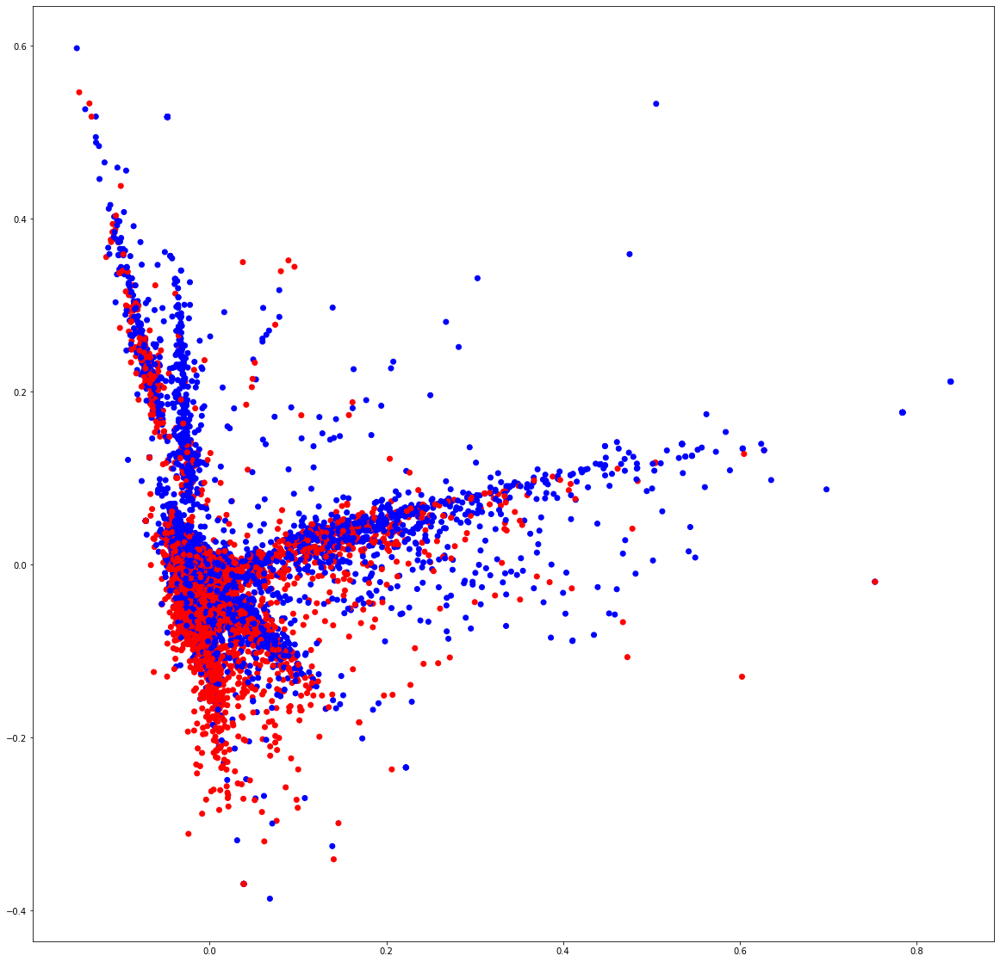

In [39]:

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).todense()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()